<a href="https://www.kaggle.com/code/ewmacdougall/alzheimer-s-diagnosis-classification-eda-ml?scriptVersionId=221491474" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Alzheimer's Diagnosis Classification EDA & ML

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


from sklearn.preprocessing import OrdinalEncoder, StandardScaler
import plotly
import scipy.stats as st

%matplotlib inline

import time
import math
import sklearn.metrics

from sklearn.linear_model import LinearRegression
import sklearn.preprocessing

from sklearn.model_selection import train_test_split

from IPython.display import display

from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, confusion_matrix
from sklearn.model_selection import GridSearchCV, train_test_split, cross_val_score
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import OrdinalEncoder, StandardScaler

import sklearn.preprocessing

import warnings
warnings.filterwarnings('ignore')
import plotly.express as px
from imblearn.over_sampling import SMOTE

## Preprocessing

In [5]:
initial_time = time.time()
initial_time

1738970635.987343

I timed the execution of this notebook because it took my CPU nearly three hours to run entirely. The runtime is noted at the end of the notebook.

In [8]:
df = pd.read_csv('Downloads/alzheimers_prediction_dataset.csv')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74283 entries, 0 to 74282
Data columns (total 25 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Country                               74283 non-null  object 
 1   Age                                   74283 non-null  int64  
 2   Gender                                74283 non-null  object 
 3   Education Level                       74283 non-null  int64  
 4   BMI                                   74283 non-null  float64
 5   Physical Activity Level               74283 non-null  object 
 6   Smoking Status                        74283 non-null  object 
 7   Alcohol Consumption                   74283 non-null  object 
 8   Diabetes                              74283 non-null  object 
 9   Hypertension                          74283 non-null  object 
 10  Cholesterol Level                     74283 non-null  object 
 11  Family History 

In [11]:
df.describe()

,Age,Education Level,BMI,Cognitive Test Score
count,74283.000000,74283.000000,74283.000000,74283.000000
mean,71.964703,9.487514,26.780639,64.654241
std,12.980748,5.757020,4.764679,20.153247
min,50.000000,0.000000,18.500000,30.000000
25%,61.000000,4.000000,22.700000,47.000000
50%,72.000000,9.000000,26.800000,65.000000
75%,83.000000,14.000000,30.900000,82.000000
max,94.000000,19.000000,35.000000,99.000000


In [14]:
df.sample(5)

,Country,Age,Gender,Education Level,BMI,Physical Activity Level,Smoking Status,Alcohol Consumption,Diabetes,Hypertension,...,Dietary Habits,Air Pollution Exposure,Employment Status,Marital Status,Genetic Risk Factor (APOE-ε4 allele),Social Engagement Level,Income Level,Stress Levels,Urban vs Rural Living,Alzheimer’s Diagnosis
60402,Saudi Arabia,56,Male,4,27.8,High,Never,Occasionally,No,Yes,...,Unhealthy,Low,Employed,Widowed,No,Low,High,Low,Rural,No
7380,Spain,81,Female,6,32.5,Low,Never,Occasionally,No,No,...,Unhealthy,High,Retired,Single,No,High,High,Medium,Rural,No
68745,Norway,80,Female,10,34.7,Medium,Former,Regularly,No,No,...,Unhealthy,Medium,Employed,Single,No,Medium,Medium,Low,Urban,Yes
67620,Brazil,72,Male,11,20.3,Medium,Current,Regularly,Yes,No,...,Healthy,Low,Unemployed,Single,No,Low,Low,Low,Rural,No
24354,Japan,76,Female,0,22.9,Medium,Never,Never,No,Yes,...,Unhealthy,High,Retired,Married,Yes,Medium,High,Low,Rural,Yes


In [16]:
for i in df.columns:
    print(df[i].value_counts(normalize=True).head(5))

Country
Brazil          0.051681
Germany         0.051250
Australia       0.050981
Russia          0.050860
South Africa    0.050617
Name: proportion, dtype: float64
Age
72    0.023303
82    0.023047
64    0.023007
60    0.022926
50    0.022899
Name: proportion, dtype: float64
Gender
Female    0.501447
Male      0.498553
Name: proportion, dtype: float64
Education Level
14    0.051290
1     0.050913
6     0.050886
15    0.050806
7     0.050442
Name: proportion, dtype: float64
BMI
19.6    0.006866
29.6    0.006866
31.4    0.006731
32.6    0.006718
29.1    0.006691
Name: proportion, dtype: float64
Physical Activity Level
High      0.334572
Low       0.333239
Medium    0.332189
Name: proportion, dtype: float64
Smoking Status
Current    0.335406
Never      0.333051
Former     0.331543
Name: proportion, dtype: float64
Alcohol Consumption
Never           0.334733
Regularly       0.333024
Occasionally    0.332243
Name: proportion, dtype: float64
Diabetes
No     0.801354
Yes    0.198646
Name: p

Value counts of each field allows for a quick view of the values of categorical variables and allows for a brief search for nulls or placeholder values that isna() wouldn't find.

In [19]:
df.duplicated().sum()

0

In [21]:
df.isna().sum()

Country                                 0
Age                                     0
Gender                                  0
Education Level                         0
BMI                                     0
Physical Activity Level                 0
Smoking Status                          0
Alcohol Consumption                     0
Diabetes                                0
Hypertension                            0
Cholesterol Level                       0
Family History of Alzheimer’s           0
Cognitive Test Score                    0
Depression Level                        0
Sleep Quality                           0
Dietary Habits                          0
Air Pollution Exposure                  0
Employment Status                       0
Marital Status                          0
Genetic Risk Factor (APOE-ε4 allele)    0
Social Engagement Level                 0
Income Level                            0
Stress Levels                           0
Urban vs Rural Living             

There are no duplicated or null values in the dataset.

## EDA

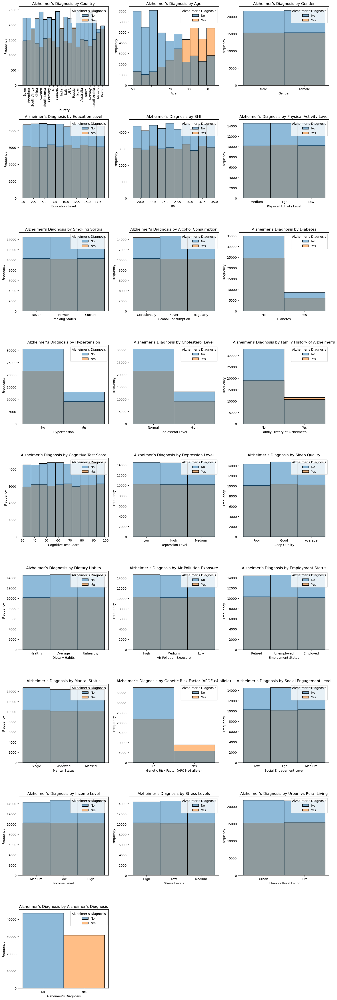

In [25]:
numeric_columns = df.columns

# Set up the number of rows and columns for subplots
n = len(numeric_columns)
cols = 3  # Number of columns for subplots
rows = (n + cols - 1) // cols  # Calculate the number of rows needed

# Create the figure and axes
fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
axes = axes.flatten()  # Flatten the axes array to make it easier to iterate

# Plot a histogram for each numeric column
for i, col in enumerate(numeric_columns):
    sns.histplot(data=df, x=col, kde=False, ax=axes[i], bins=10, edgecolor='black', color='skyblue', hue='Alzheimer’s Diagnosis')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Alzheimer’s Diagnosis by {col}')
    if col == 'Country':
        axes[i].tick_params(axis='x', rotation=90)


# Hide any extra subplots if the numeric columns are not divisible by three.
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout to ensure there's no overlap
plt.tight_layout()

# Show the figure
plt.show()

The grey areas of the subplots represent overlap between a positive and negative Alzheimer's Diagnosis in the histogram of the field. Which diagnosis is more common depends on whether the blue or orange tops the histogram plot.

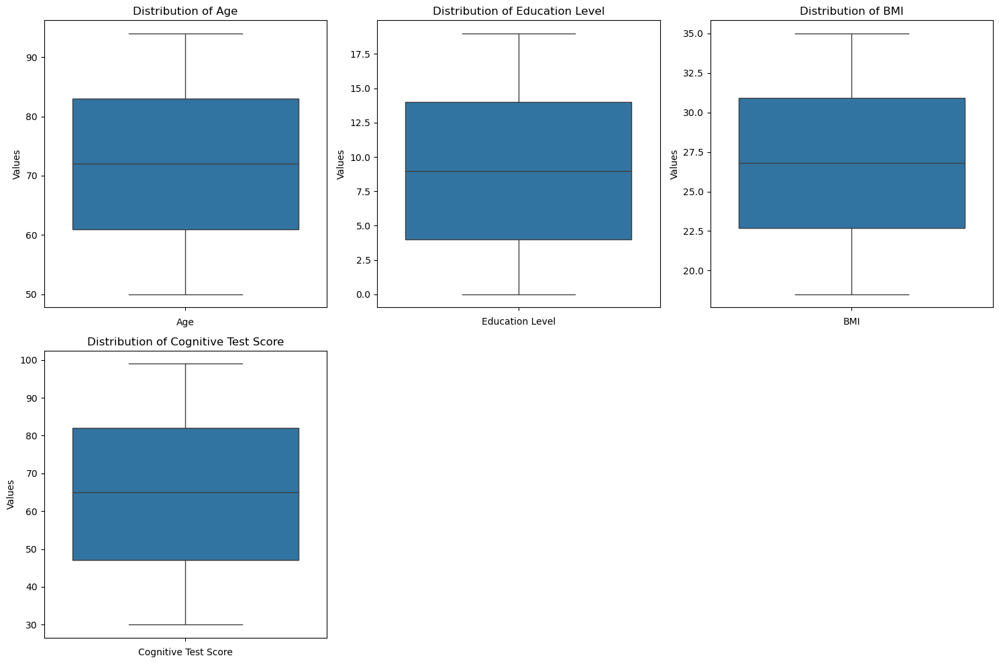

In [27]:
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Set up the number of rows and columns for subplots
n = len(numeric_columns)
cols = 3  # Number of columns for subplots
rows = (n + cols - 1) // cols  # Calculate the number of rows needed

# Create the figure and axes
fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
axes = axes.flatten()  # Flatten the axes array to make it easier to iterate

# Plot a boxplot for each numeric column
for i, col in enumerate(numeric_columns):
    sns.boxplot(data=df[col], ax=axes[i])
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Values')
    axes[i].set_title(f'Distribution of {col}')
   # axes[i].tick_params(axis='x', rotation=90)

# Hide any extra subplots if the numeric columns are not divisible by three.
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust the layout to ensure there's no overlap
plt.tight_layout()

# Show the figure
plt.show()

In [28]:
df.groupby('Gender')['Genetic Risk Factor (APOE-ε4 allele)'].value_counts()

Gender  Genetic Risk Factor (APOE-ε4 allele)
Female  No                                      29874
        Yes                                      7375
Male    No                                      29687
        Yes                                      7347
Name: count, dtype: int64

In [29]:
categorical_features = df.columns.drop(['Age', 'Education Level', 'BMI', 'Cognitive Test Score'])
df_ord = df.copy()
encoder = OrdinalEncoder()
df_ord[categorical_features] = encoder.fit_transform(df[categorical_features])
df_ord.sample(5)

,Country,Age,Gender,Education Level,BMI,Physical Activity Level,Smoking Status,Alcohol Consumption,Diabetes,Hypertension,...,Dietary Habits,Air Pollution Exposure,Employment Status,Marital Status,Genetic Risk Factor (APOE-ε4 allele),Social Engagement Level,Income Level,Stress Levels,Urban vs Rural Living,Alzheimer’s Diagnosis
60567,2.0,86,0.0,2,24.5,1.0,2.0,0.0,0.0,0.0,...,1.0,2.0,2.0,0.0,1.0,2.0,2.0,2.0,1.0,0.0
42469,4.0,80,1.0,18,27.0,2.0,1.0,2.0,0.0,0.0,...,2.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0
15946,14.0,76,1.0,5,31.2,2.0,0.0,1.0,0.0,0.0,...,2.0,2.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
41822,17.0,69,0.0,19,19.4,0.0,0.0,1.0,0.0,1.0,...,2.0,2.0,2.0,2.0,0.0,0.0,2.0,1.0,0.0,0.0
11607,19.0,70,0.0,18,27.9,1.0,0.0,1.0,0.0,1.0,...,1.0,2.0,1.0,1.0,0.0,2.0,2.0,1.0,0.0,0.0


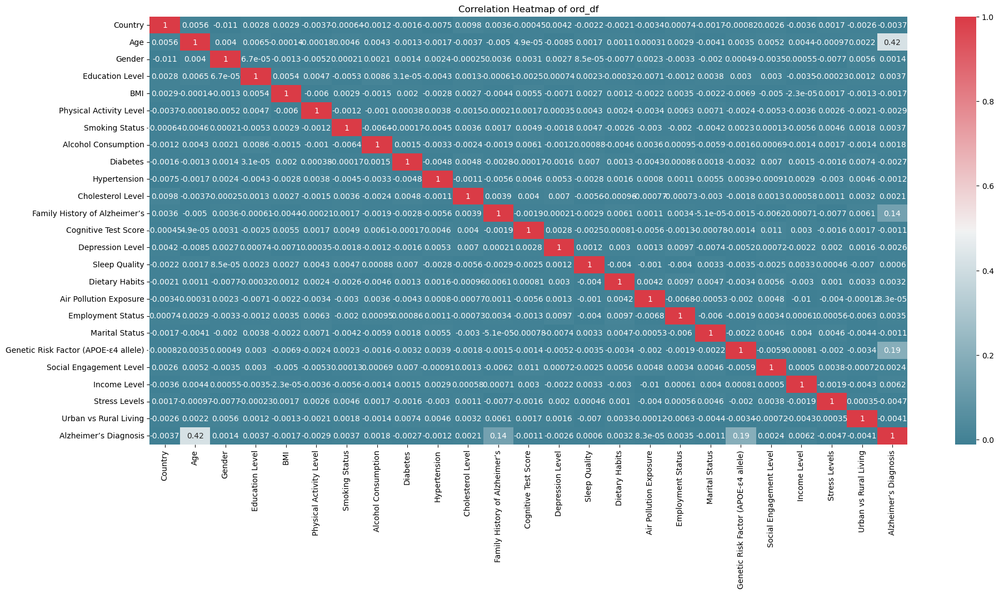

In [30]:
numerical_columns = df_ord.select_dtypes(include=[np.number])
corr = numerical_columns.corr()
plt.figure(figsize=(22, 10))
sns.heatmap(corr, cmap=sns.diverging_palette(220, 10, as_cmap=True), annot=True)
plt.title(label='Correlation Heatmap of ord_df')
plt.show()

Alzheimer's disease is associated with 'Age', 'family history of Alzheimer's', and 'Genetic Risk Factor (APOE-ε4 allele)'.

### Data Splitting

In [33]:
train_ord, test_ord = train_test_split(df_ord, test_size=0.2, random_state=42)

# Then split the train+val into train and validation
test_ord, val_ord = train_test_split(test_ord, test_size=.5, random_state=42)  # 0.5 x 0.2 = 0.1

The number of categorical variables and the desire to not add more dimensionality to the data made ordinal encoding the most sensible choice.

In [35]:
train_ord.shape

(59426, 25)

In [36]:
val_ord.shape

(7429, 25)

In [37]:
test_ord.shape

(7428, 25)

In [38]:
train_ord.info()

<class 'pandas.core.frame.DataFrame'>
Index: 59426 entries, 14565 to 15795
Data columns (total 25 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Country                               59426 non-null  float64
 1   Age                                   59426 non-null  int64  
 2   Gender                                59426 non-null  float64
 3   Education Level                       59426 non-null  int64  
 4   BMI                                   59426 non-null  float64
 5   Physical Activity Level               59426 non-null  float64
 6   Smoking Status                        59426 non-null  float64
 7   Alcohol Consumption                   59426 non-null  float64
 8   Diabetes                              59426 non-null  float64
 9   Hypertension                          59426 non-null  float64
 10  Cholesterol Level                     59426 non-null  float64
 11  Family History o

In [39]:
feature_columns = df_ord.columns.drop('Alzheimer’s Diagnosis').tolist()
scaler = StandardScaler()

train_ord.loc[:, feature_columns] = scaler.fit_transform(train_ord.loc[:, feature_columns])
    
# Transform the validation and test sets
val_ord.loc[:, feature_columns] = scaler.transform(val_ord.loc[:, feature_columns])
test_ord.loc[:, feature_columns] = scaler.transform(test_ord.loc[:, feature_columns])

## Modeling

These methods are meant to create models, evaluate them, and generate reports on their performance. There are methods to plot certain performance metrics and feature importance charts. I also have methods for upsampling, downsampling, and SMOTE to ensure a class balance after data splitting. All methods are run in the next section.

In [42]:
eval_stats_all = pd.DataFrame()

In [43]:
def model_to_string(model):
    # Method records the name and parameters of each model and returns it as a string.
    model_name = type(model).__name__  # Get the class name of the model
    params = model.get_params()  # Get the model parameters
    params_str = ', '.join(f'{k}={v}' for k, v in params.items())  # Create a formatted string of parameters
    return f"{model_name}({params_str})"

In [44]:
def record_metrics(model, df_eval_stats):
    # Method records the performance of each model on the test set in a global dataframe for easy reference and comparison in the
    # 'Conclusions' section. Returns an updated dataframe.
    global eval_stats_all

    metrics_row = {
        'model_name': type(model).__name__,
        'full_model': model_to_string(model),
        'test_accuracy': df_eval_stats['test'].get('Accuracy', None),
        'test_f1': df_eval_stats['test'].get('F1', None),
        'test_roc_auc': df_eval_stats['test'].get('ROC AUC', None),
        'test_aps': df_eval_stats['test'].get('APS', None)
    }
    
    metrics_df = pd.DataFrame([metrics_row])
    
    # Concatenate the new row to the existing DataFrame
    eval_stats_all = pd.concat([eval_stats_all, metrics_df], ignore_index=True)
            
    return eval_stats_all

In [45]:
import sklearn.metrics as metrics

def evaluate_model(model, train_features, train_target, test_features, test_target, val_features=None, val_target=None):
    # Method plots several graphs for a model's performance as well as prints out evaluation
    eval_stats = {}
    
    fig, axs = plt.subplots(1, 3, figsize=(20, 6)) 

    if (val_features is None or val_target is None):
        sets = (('train', train_features, train_target), ('test', test_features, test_target))
    else: 
        sets = (('train', train_features, train_target), ('val', val_features, val_target), ('test', test_features, test_target))
    
    for type, features, target in sets:
        
        eval_stats[type] = {}
    
        pred_target = model.predict(features)
        pred_proba = model.predict_proba(features)[:, 1]
        
        # F1
        f1_thresholds = np.arange(0, 1.01, 0.05)
        f1_scores = [metrics.f1_score(target, pred_proba>=threshold) for threshold in f1_thresholds]
        
        # ROC
        fpr, tpr, roc_thresholds = metrics.roc_curve(target, pred_proba)
        roc_auc = metrics.roc_auc_score(target, pred_proba)    
        eval_stats[type]['ROC AUC'] = roc_auc

        # PRC
        precision, recall, pr_thresholds = metrics.precision_recall_curve(target, pred_proba)
        aps = metrics.average_precision_score(target, pred_proba)
        eval_stats[type]['APS'] = aps
        
        if type == 'train':
            color = 'blue'
        elif type == 'val':
            color = 'pink'
        elif type == 'test':
            color = 'green'

        # F1 Score
        ax = axs[0]
        max_f1_score_idx = np.argmax(f1_scores)
        ax.plot(f1_thresholds, f1_scores, color=color, label=f'{type}, max={f1_scores[max_f1_score_idx]:.2f} @ {f1_thresholds[max_f1_score_idx]:.2f}')
        # setting crosses for some thresholds
        for threshold in (0.2, 0.4, 0.5, 0.6, 0.8):
            closest_value_idx = np.argmin(np.abs(f1_thresholds-threshold))
            marker_color = 'orange' if threshold != 0.5 else 'red'
            ax.plot(f1_thresholds[closest_value_idx], f1_scores[closest_value_idx], color=marker_color, marker='X', markersize=7)
        ax.set_xlim([-0.02, 1.02])    
        ax.set_ylim([-0.02, 1.02])
        ax.set_xlabel('threshold')
        ax.set_ylabel('F1')
        ax.legend(loc='lower center')
        ax.set_title(f'F1 Score') 

        # ROC
        ax = axs[1]    
        ax.plot(fpr, tpr, color=color, label=f'{type}, ROC AUC={roc_auc:.2f}')
        # setting crosses for some thresholds
        for threshold in (0.2, 0.4, 0.5, 0.6, 0.8):
            closest_value_idx = np.argmin(np.abs(roc_thresholds-threshold))
            marker_color = 'orange' if threshold != 0.5 else 'red'            
            ax.plot(fpr[closest_value_idx], tpr[closest_value_idx], color=marker_color, marker='X', markersize=7)
        ax.plot([0, 1], [0, 1], color='grey', linestyle='--')
        ax.set_xlim([-0.02, 1.02])    
        ax.set_ylim([-0.02, 1.02])
        ax.set_xlabel('FPR')
        ax.set_ylabel('TPR')
        ax.legend(loc='lower center')        
        ax.set_title(f'ROC Curve')
        
        # PRC
        ax = axs[2]
        ax.plot(recall, precision, color=color, label=f'{type}, AP={aps:.2f}')
        # setting crosses for some thresholds
        for threshold in (0.2, 0.4, 0.5, 0.6, 0.8):
            closest_value_idx = np.argmin(np.abs(pr_thresholds-threshold))
            marker_color = 'orange' if threshold != 0.5 else 'red'
            ax.plot(recall[closest_value_idx], precision[closest_value_idx], color=marker_color, marker='X', markersize=7)
        ax.set_xlim([-0.02, 1.02])    
        ax.set_ylim([-0.02, 1.02])
        ax.set_xlabel('recall')
        ax.set_ylabel('precision')
        ax.legend(loc='lower center')
        ax.set_title(f'PRC')        

        eval_stats[type]['Accuracy'] = metrics.accuracy_score(target, pred_target)
        eval_stats[type]['F1'] = metrics.f1_score(target, pred_target)
    
    df_eval_stats = pd.DataFrame(eval_stats)
    df_eval_stats = df_eval_stats.round(6)
    df_eval_stats = df_eval_stats.reindex(index=('Accuracy', 'F1', 'APS', 'ROC AUC'))

    record_metrics(model, df_eval_stats)
    
    print(df_eval_stats)
    plt.show()
    
    return

In [46]:
def structure_confusion_matrix(matrix):
        #  This  method  structures  a  confusion_matrix  instance  so  that  it  is  easier  read.
        print('Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.')
        display(pd.DataFrame(matrix,  columns=['Predicted  False',  'Predicted  True'],  index=['Is  False',  'Is  True']).div(matrix.sum(axis=1),  axis=0))
        display(pd.DataFrame(matrix,  columns=['Predicted  False',  'Predicted  True'],  index=['Is  False',  'Is  True']))

In [47]:
def chart_feature_importance(features_train, model):
    # Feature importance charts can render which features were most consequential to a model. These charts can be created for tree-based and
    # gradient boosting algorithms.
    
    # Get feature importances
    importances = model.feature_importances_
    feature_names = features_train.columns
    
    # Create a DataFrame for better visualization
    importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
    
    # Sort the DataFrame by importance
    importance_df = importance_df.sort_values(by='Importance', ascending=True)
    
    # Plot feature importances

    fig = px.bar(importance_df, x="Importance", y="Feature", orientation='h',
             hover_data=["Importance"],
          #   height=400,
             title='Feature Importance',
            color_discrete_sequence=['skyblue'])
    fig.show()

In [48]:
def downsample(train_df, target_field):
    # Method breaks a dataframe into features and the target field. Whichever field is more represented will be
    # randomly sampled until the target feature is evenly split between 0 and 1 values. The dataframe is reassembled,
    # randomly shuffled, and returned.
    features = train_df.drop([target_field], axis=1)
    target = train_df[target_field]

    class_0, class_1 = target.value_counts()
    
    if class_0 > class_1:
        train_df = pd.concat([train_df.loc[train_df[target_field]<=0, :].sample(class_1, random_state=42), train_df.loc[train_df[target_field]>=1, :]], axis=0).sample(frac=1)
    elif class_1 > class_0:
        train_df = pd.concat([train_df.loc[train_df[target_field]>=1, :].sample(class_1, random_state=42), train_df.loc[train_df[target_field]<=0, :]], axis=0).sample(frac=1)
    
    return train_df

In [49]:
def upsample(train_df, target_field):
    # Method breaks a dataframe into features and the target field. Whichever field is less represented will be
    # randomly sampled and replicated until the target feature is evenly split between 0 and 1 values. 
    # The dataframe is reassembled, randomly shuffled, and returned.
    features = train_df.drop([target_field], axis=1)
    target = train_df[target_field]
    
    class_0, class_1 = target.value_counts()
        
    if class_0 > class_1:
        train_df = pd.concat([train_df.loc[train_df[target_field]>=1, :].sample(class_0, replace=True, random_state=42), train_df.loc[train_df[target_field]<=0, :]], axis=0).sample(frac=1)
    elif class_1 > class_0:
        train_df = pd.concat([train_df.loc[train_df[target_field]<=0, :].sample(class_1, replace=True, random_state=42), train_df.loc[train_df[target_field]>=1, :]], axis=0).sample(frac=1)
    
    return train_df

In [50]:
def logistic_regression(train_df, val_df, test_df, balanced=None, samp=None, target_field='churn'):

    model = LogisticRegression(random_state=42, solver='liblinear', class_weight=balanced)
    
    train_original = train_df.copy()
    samp = samp.lower()
    
    train_df = choose_sampling(train_df, target_field, samp)

    model.fit(train_df.drop([target_field], axis=1), train_df[target_field])

    test_predictions = model.predict(test_df.drop([target_field], axis=1))

    structure_confusion_matrix(confusion_matrix(test_df[target_field], test_predictions))
    evaluate_model(model, train_features=train_df.drop(columns=target_field, axis=1), train_target=train_df[target_field], 
                   test_features=test_df.drop(columns=target_field, axis=1), test_target=test_df[target_field], 
                   val_features=val_df.drop(columns=target_field, axis=1), val_target=val_df[target_field])

    train_df = train_original.copy()

In [51]:
def random_forest_model(train_df, val_df, test_df, balanced=None, samp=None, target_field='churn'):

    train_original = train_df.copy()
    samp = samp.lower()
    
    train_df = choose_sampling(train_df, target_field, samp)

    model = RandomForestClassifier(random_state=42, class_weight=balanced, n_estimators= 100,
    max_depth=8,       # Maximum depth of the trees
    min_samples_split=3,      # Minimum number of samples required to split an internal node
    min_samples_leaf= 6,        # Minimum number of samples required to be at a leaf node
    max_features='sqrt'  # Number of features to consider when looking for the best split
) # set number of trees
    model.fit(train_df.drop([target_field], axis=1), train_df[target_field]) # train model on training set
    test_predictions = model.predict(test_df.drop([target_field], axis=1))

    structure_confusion_matrix(confusion_matrix(test_df[target_field], test_predictions))
    evaluate_model(model, train_features=train_df.drop(columns=target_field, axis=1), train_target=train_df[target_field], 
                   test_features=test_df.drop(columns=target_field, axis=1), test_target=test_df[target_field], 
                   val_features=val_df.drop(columns=target_field, axis=1), val_target=val_df[target_field])
    chart_feature_importance(features_train=train_df.drop(columns=target_field, axis=1), model=model)

    train_df = train_original.copy()

In [52]:
def extra_trees_model(train_df, val_df, test_df, balanced=None, samp=None, target_field='churn'):

    train_original = train_df.copy()
    samp = samp.lower()
    
    train_df = choose_sampling(train_df, target_field, samp)

    model = ExtraTreesClassifier(random_state=42, class_weight=balanced, n_estimators= 100,
    max_depth=8,       # Maximum depth of the trees
    min_samples_split=3,      # Minimum number of samples required to split an internal node
    min_samples_leaf= 6,        # Minimum number of samples required to be at a leaf node
    max_features='sqrt', 
    bootstrap=True                             # Number of features to consider when looking for the best split
) # set number of trees
    
    model.fit(train_df.drop([target_field], axis=1), train_df[target_field]) # fit model on training set
    test_predictions = model.predict(test_df.drop([target_field], axis=1))

    structure_confusion_matrix(confusion_matrix(test_df[target_field], test_predictions))
    evaluate_model(model, train_features=train_df.drop(columns=target_field, axis=1), train_target=train_df[target_field], 
                   test_features=test_df.drop(columns=target_field, axis=1), test_target=test_df[target_field], 
                   val_features=val_df.drop(columns=target_field, axis=1), val_target=val_df[target_field])
    chart_feature_importance(features_train=train_df.drop(columns=target_field, axis=1), model=model)

    train_df = train_original.copy()

In [53]:
!pip install catboost

In [54]:
def CatBoostClassifier_model(train_df, val_df, test_df, balanced=None, samp=None, target_field='churn'):
        from catboost import CatBoostClassifier

        train_original = train_df.copy()
        samp = samp.lower()
    
        train_df = choose_sampling(train_df, target_field, samp)

        # Create and train the CatBoost model
        model = CatBoostClassifier(iterations=500, learning_rate=0.1,
                                                            depth=6,
                                                            eval_metric='AUC',
                                                            random_seed=42,
                                                            verbose=0)
    
        model.fit(train_ord.drop([target_field], axis=1), train_ord[target_field], 
             eval_set=(val_ord.drop(columns=target_field, axis=1), val_ord[target_field]), 
             early_stopping_rounds=50)

        test_predictions = model.predict(test_df.drop([target_field], axis=1))

        structure_confusion_matrix(confusion_matrix(test_df[target_field], test_predictions))
        evaluate_model(model, train_features=train_df.drop(columns=target_field, axis=1), train_target=train_df[target_field], 
                   test_features=test_df.drop(columns=target_field, axis=1), test_target=test_df[target_field], 
                   val_features=val_df.drop(columns=target_field, axis=1), val_target=val_df[target_field])
        
        chart_feature_importance(features_train=train_df.drop(columns=target_field, axis=1), model=model)
        train_df = train_original.copy()

In [55]:
def choose_sampling(train_df, target_field, samp):
    # Method refers a specific samp to the proper sampling method and returns an updated train_df.
    if samp == 'up':
        train_df = upsample(train_df, target_field)
    elif samp == 'down':
        train_df = downsample(train_df, target_field)  
    elif samp == 'smote':
        smote = SMOTE(random_state=42)
        X_resampled, y_resampled = smote.fit_resample(train_df.drop(columns=target_field), train_df[target_field])
        train_df = pd.DataFrame(X_resampled, columns=train_df.columns)
        train_df[target_field] = y_resampled
    
    print(train_df[target_field].value_counts())
    return train_df

In [56]:
from  sklearn.dummy  import  DummyClassifier

def dummy_classifier(train_df, val_df, test_df, balanced=None, samp=None, target_field='churn'):

    dummy  =  DummyClassifier(strategy='constant',  constant=1,  random_state=42)
    dummy.fit(train_ord.drop(columns=target_field),  train_ord[target_field])
    test_predictions = dummy.predict(test_df.drop([target_field], axis=1))
    
    structure_confusion_matrix(confusion_matrix(test_df[target_field], test_predictions))
    evaluate_model(model=dummy, train_features=train_df.drop(columns=target_field, axis=1), train_target=train_df[target_field], 
                   test_features=test_df.drop(columns=target_field, axis=1), test_target=test_df[target_field], 
                   val_features=val_df.drop(columns=target_field, axis=1), val_target=val_df[target_field])

In [57]:
from sklearn.linear_model import SGDClassifier

def sgd_classifier(train_df, val_df, test_df, balanced=None, samp=None, target_field='churn'):

    train_original = train_df.copy()
    samp = samp.lower()
    
    train_df = choose_sampling(train_df, target_field, samp)

    model = SGDClassifier(loss='log_loss', max_iter=1000, tol=.05, random_state=42, learning_rate='adaptive', eta0=.01, verbose=0)
    
    # Fit  the  model  with  evaluation  set
    model.fit(train_ord.drop([target_field], axis=1), train_ord[target_field]) # train model on training set

     #  Predict  on  the  test  data
    test_predictions = model.predict(test_df.drop([target_field], axis=1))

    structure_confusion_matrix(confusion_matrix(test_df[target_field], test_predictions))
    evaluate_model(model, train_features=train_df.drop(columns=target_field, axis=1), train_target=train_df[target_field], 
                   test_features=test_df.drop(columns=target_field, axis=1), test_target=test_df[target_field], 
                   val_features=val_df.drop(columns=target_field, axis=1), val_target=val_df[target_field])
        
    train_df = train_original.copy()

In [58]:
! pip install xgboost --quiet

In [59]:
! pip install --upgrade xgboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 22.3 MB/s eta 0:00:00
  Attempting uninstall: xgboost
    Found existing installation: xgboost 2.1.3
    Uninstalling xgboost-2.1.3:
      Successfully uninstalled xgboost-2.1.3


In [60]:
from xgboost import XGBClassifier

def XGBmodel(train_df, val_df, test_df, balanced=None, samp=None, target_field='churn'):

        train_original = train_df.copy()
        samp = samp.lower()
    
        train_df = choose_sampling(train_df, target_field, samp)

        # Create and configure the XGBoost model
        model = XGBClassifier(
                n_estimators=500,                    #  Similar  to  iterations
                learning_rate=.1,                  #  Learning  rate
                max_depth=5,                              #  Similar  to  depth
                eval_metric='auc', #  Evaluation  metric
                random_state=42,
                verbosity=0                                  #  Verbosity  to  show  evaluation  metrics
        )

        #  Fit  the  model  with  evaluation  set
        model.fit(train_ord.drop([target_field], axis=1), train_ord[target_field], 
                 eval_set=[(val_ord.drop(columns=target_field, axis=1), val_ord[target_field])],
                 verbose=0) # fit model on training set

        #  Predict  on  the  test  data
        test_predictions = model.predict(test_df.drop([target_field], axis=1))

        structure_confusion_matrix(confusion_matrix(test_df[target_field], test_predictions))
        evaluate_model(model, train_features=train_df.drop(columns=target_field, axis=1), train_target=train_df[target_field], 
                   test_features=test_df.drop(columns=target_field, axis=1), test_target=test_df[target_field], 
                   val_features=val_df.drop(columns=target_field, axis=1), val_target=val_df[target_field])
        
        chart_feature_importance(features_train=train_df.drop(columns=target_field, axis=1), model=model)
        train_df = train_original.copy()

In [61]:
! pip install lightgbm --quiet

In [62]:
from lightgbm import LGBMClassifier

def lgbmclassifier(train_df, val_df, test_df, balanced=None, samp=None, target_field='churn'):

        train_original = train_df.copy()
        samp = samp.lower()
    
        train_df = choose_sampling(train_df, target_field, samp)

        model = LGBMClassifier(boosting_type='gbdt', verbose=0, random_state=42)    #  LGBMClassifier  model

        # Train  the  model
        model.fit(train_ord.drop([target_field], axis=1), train_ord[target_field], 
             eval_set=[(val_ord.drop(columns=target_field, axis=1), val_ord[target_field])], 
             eval_metric='auc')

        #  Predict  on  the  test  data
        test_predictions = model.predict(test_df.drop([target_field], axis=1))

        structure_confusion_matrix(confusion_matrix(test_df[target_field], test_predictions))
        evaluate_model(model, train_features=train_df.drop(columns=target_field, axis=1), train_target=train_df[target_field], 
                   test_features=test_df.drop(columns=target_field, axis=1), test_target=test_df[target_field], 
                   val_features=val_df.drop(columns=target_field, axis=1), val_target=val_df[target_field])
        
        chart_feature_importance(features_train=train_df.drop(columns=target_field, axis=1), model=model)
        train_df = train_original.copy()

## Model Testing

Executing the models creates a report with a confusion matrix, performance metrics for the model on the training, validation, and test sets, plots F1 Score, ROC Curve, and PRC, and a features importance chart if applicable to the model. The validation set is used as an additional test set when not used in combination with a search algorithm or used as an evaluation set for a gradient boosting algorithm. 

### Dummy Baseline

Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.0,1.0
Is True,0.0,1.0


,Predicted False,Predicted True
Is False,0,4353
Is True,0,3075


             train       val      test
Accuracy  0.413540  0.412303  0.413974
F1        0.585112  0.583873  0.585547
APS       0.413540  0.412303  0.413974
ROC AUC   0.500000  0.500000  0.500000


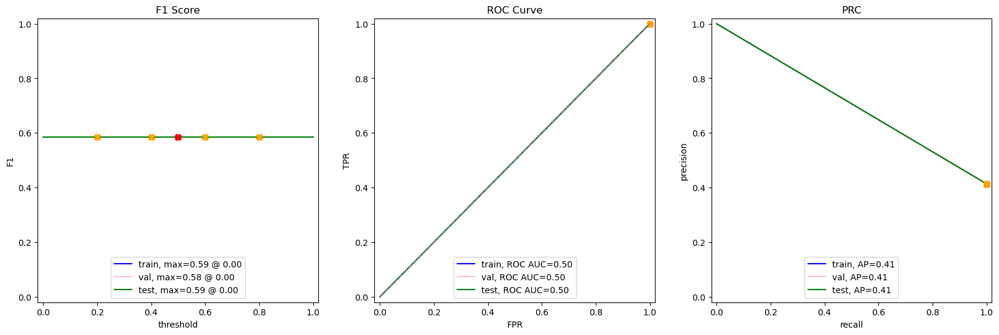

In [66]:
dummy_classifier(train_ord, val_ord, test_ord, balanced=None, samp=None, target_field='Alzheimer’s Diagnosis')

This dummy classifier operates as our sanity check for examining model performance. Every ML model should perform better than this.

### LogisticRegression

Alzheimer’s Diagnosis
0.0    34851
1.0    34851
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.708936,0.291064
Is True,0.294309,0.705691


,Predicted False,Predicted True
Is False,3086,1267
Is True,905,2170


             train       val      test
Accuracy  0.712792  0.716247  0.707593
F1        0.715077  0.679050  0.666462
APS       0.765804  0.712212  0.698086
ROC AUC   0.784110  0.790341  0.782858


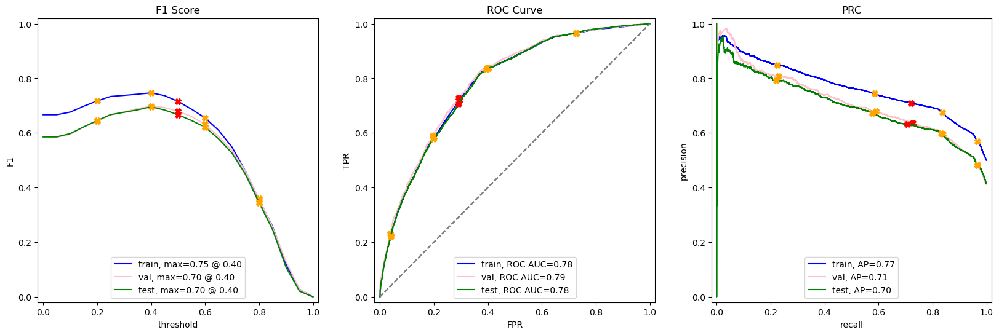

In [69]:
logistic_regression(train_ord, val_ord, test_ord, balanced='balanced', samp='up', target_field="Alzheimer’s Diagnosis")

Alzheimer’s Diagnosis
0.0    24575
1.0    24575
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.708477,0.291523
Is True,0.288130,0.711870


,Predicted False,Predicted True
Is False,3084,1269
Is True,886,2189


             train       val      test
Accuracy  0.714120  0.716651  0.709882
F1        0.716502  0.679653  0.670136
APS       0.765704  0.712256  0.698090
ROC AUC   0.784893  0.790516  0.782617


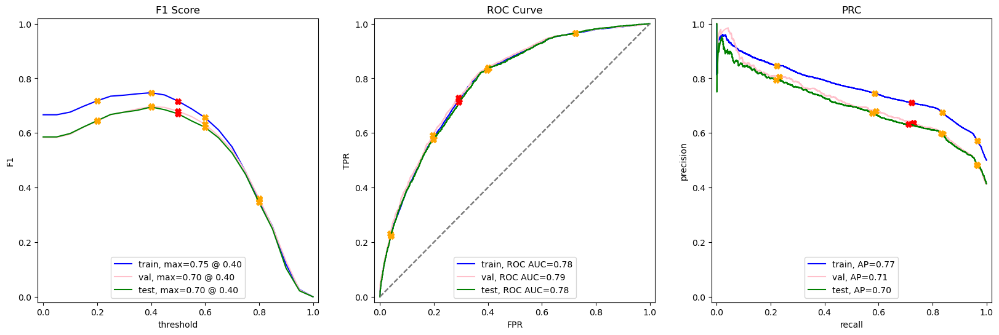

In [71]:
logistic_regression(train_ord, val_ord, test_ord, balanced='balanced', samp='down', target_field="Alzheimer’s Diagnosis")

Alzheimer’s Diagnosis
0.0    34851
1.0    34851
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.709166,0.290834
Is True,0.292033,0.707967


,Predicted False,Predicted True
Is False,3087,1266
Is True,898,2177


             train       val      test
Accuracy  0.718100  0.717593  0.708670
F1        0.721168  0.679988  0.667996
APS       0.764314  0.711867  0.697759
ROC AUC   0.788023  0.790485  0.782646


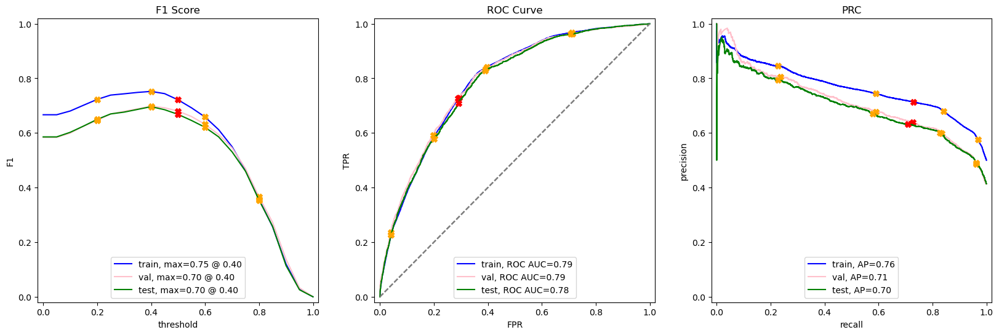

In [72]:
logistic_regression(train_ord, val_ord, test_ord, balanced='balanced', samp='smote', target_field="Alzheimer’s Diagnosis")

Just a simple LogisticRegression makes a significant improvement in the metrics of the test set, though this model does not meet our threshold for success.

### GridSearchCV

Only a few search algorithms were added due to the time requirements they take to find the best model parameters. The command %%time was also added to these cells to provide the overall CPU/wall time for these cells. I will use SMOTE to sample the training set for all search algorithms and will reset the value of train_ord when I move on to the RandomForestClassifier and following models.

In [76]:
train_search = train_ord.copy()
target_field="Alzheimer’s Diagnosis"
train_ord = choose_sampling(train_ord, target_field, samp='smote')

Alzheimer’s Diagnosis
0.0    34851
1.0    34851
Name: count, dtype: int64


Best Parameters: {'learning_rate': 0.12, 'max_depth': 3, 'n_estimators': 300, 'num_leaves': 31}
Best Score: 0.8606208573453167
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.755111,0.244889
Is True,0.321301,0.678699


,Predicted False,Predicted True
Is False,3287,1066
Is True,988,2087


             train       val      test
Accuracy  0.773708  0.725939  0.723479
F1        0.776994  0.677338  0.670199
APS       0.880207  0.737306  0.723832
ROC AUC   0.867444  0.805056  0.800302


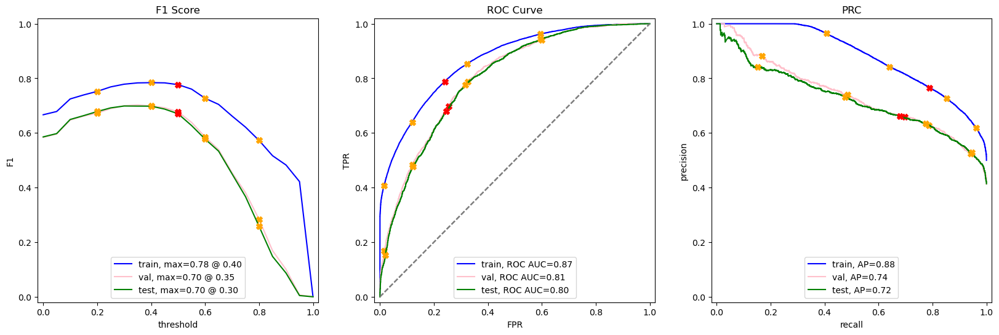

CPU times: user 10min 26s, sys: 2min 18s, total: 12min 45s
Wall time: 1min 52s


In [79]:
%%time

lgbm = LGBMClassifier(verbosity=-1)

# Define a parameter grid to search
param_grid = {
    'num_leaves': [31, 35, 30],
    'max_depth': [3],
    'learning_rate': [0.2, 0.15, 0.1, .12],
    'n_estimators': [325, 300, 275]
}

# Set up the GridSearchCV
grid_search = GridSearchCV(estimator=lgbm, 
                           param_grid=param_grid, 
                           scoring='roc_auc',  # or 'roc_auc' for binary classification
                           cv=5, 
                           verbose=0, 
                           n_jobs=None)

# Fit the model
grid_search.fit(train_ord.drop([target_field], axis=1), train_ord[target_field])

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

best_lgbm = LGBMClassifier(verbosity=-1, **grid_search.best_params_)

# Fit the model on the training data
best_lgbm.fit(train_ord.drop([target_field], axis=1), train_ord[target_field], 
             eval_set=[(val_ord.drop(columns=target_field, axis=1), val_ord[target_field])], 
             eval_metric='auc')

# Predict on the test set
test_predictions = best_lgbm.predict(test_ord.drop([target_field], axis=1))

# Evaluate the model
structure_confusion_matrix(confusion_matrix(test_ord[target_field], test_predictions))
evaluate_model(model=best_lgbm, train_features=train_ord.drop(columns=target_field, axis=1), train_target=train_ord[target_field], 
                   test_features=test_ord.drop(columns=target_field, axis=1), test_target=test_ord[target_field], 
                   val_features=val_ord.drop(columns=target_field, axis=1), val_target=val_ord[target_field])
        
chart_feature_importance(features_train=train_ord.drop(columns=target_field, axis=1), model=best_lgbm)

Fitting 5 folds for each of 1200 candidates, totalling 6000 fits
Best Parameters: {'gamma': 0.3, 'learning_rate': 0.2, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 300}
Best Score: 0.8599313989105143
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.757409,0.242591
Is True,0.328455,0.671545


,Predicted False,Predicted True
Is False,3297,1056
Is True,1010,2065


             train       val      test
Accuracy  0.775387  0.727420  0.721863
F1        0.777443  0.676466  0.666559
APS       0.881424  0.735899  0.723632
ROC AUC   0.868824  0.804187  0.800031


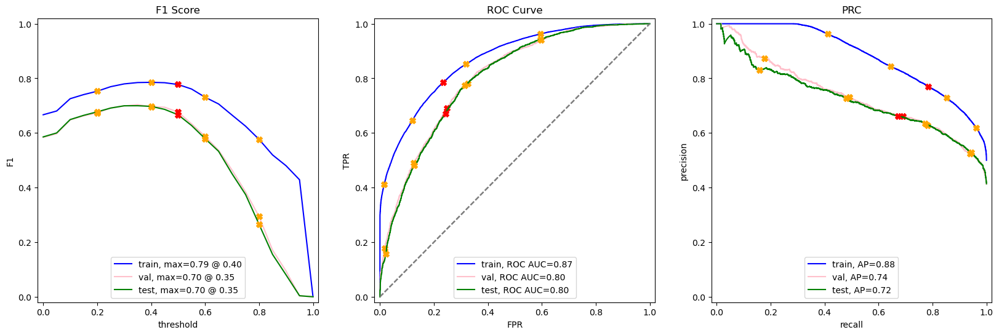

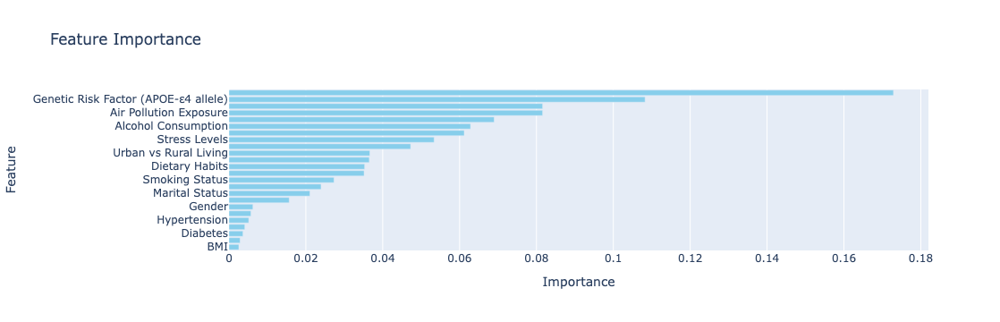

CPU times: user 5h 46min 49s, sys: 1h 15min 42s, total: 7h 2min 31s
Wall time: 1h 1min 35s


In [80]:
%%time

xgb = XGBClassifier(verbosity=1)

# Define a parameter grid to search
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of boosting rounds
    'learning_rate': [0.01, 0.05, 0.1, 0.2, 0.3],  # Step size shrinkage
    'max_depth': [3, 4, 5, 6, 7],  # Maximum depth of a tree
    'min_child_weight': [2, 3, 4, 5],  # Minimum sum of instance weight (hessian) needed in a child
    'gamma': [0.1, 0.2, 0.3, 0.4],  # Minimum loss reduction required to make a further partition
 }


# Set up the GridSearchCV
grid_search = GridSearchCV(estimator=xgb, 
                           param_grid=param_grid, 
                           scoring='roc_auc',  # or 'roc_auc' for binary classification
                           cv=5, 
                           verbose=1, 
                           n_jobs=None)

# Fit the model
grid_search.fit(train_ord.drop([target_field], axis=1), train_ord[target_field])

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

best_xgb = XGBClassifier(verbosity=0, **grid_search.best_params_)

# Fit the model on the training data
best_xgb.fit(train_ord.drop([target_field], axis=1), train_ord[target_field], 
             eval_set=[(val_ord.drop(columns=target_field, axis=1), val_ord[target_field])], verbose=0)

# Predict on the test set
test_predictions = best_xgb.predict(test_ord.drop([target_field], axis=1))

# Evaluate the model
structure_confusion_matrix(confusion_matrix(test_ord[target_field], test_predictions))
evaluate_model(model=best_xgb, train_features=train_ord.drop(columns=target_field, axis=1), train_target=train_ord[target_field], 
                   test_features=test_ord.drop(columns=target_field, axis=1), test_target=test_ord[target_field], 
                   val_features=val_ord.drop(columns=target_field, axis=1), val_target=val_ord[target_field])
        
chart_feature_importance(features_train=train_ord.drop(columns=target_field, axis=1), model=best_xgb)

Best Parameters: {'class_weight': 'balanced', 'max_depth': 9, 'max_features': 'log2', 'min_samples_leaf': 5, 'min_samples_split': 3, 'n_estimators': 85}
Best Score: 0.8329442185610196
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.731679,0.268321
Is True,0.281626,0.718374


,Predicted False,Predicted True
Is False,3185,1168
Is True,866,2209


             train       val      test
Accuracy  0.762876  0.724997  0.726171
F1        0.770616  0.686897  0.684749
APS       0.856912  0.723843  0.714563
ROC AUC   0.854421  0.794623  0.793420


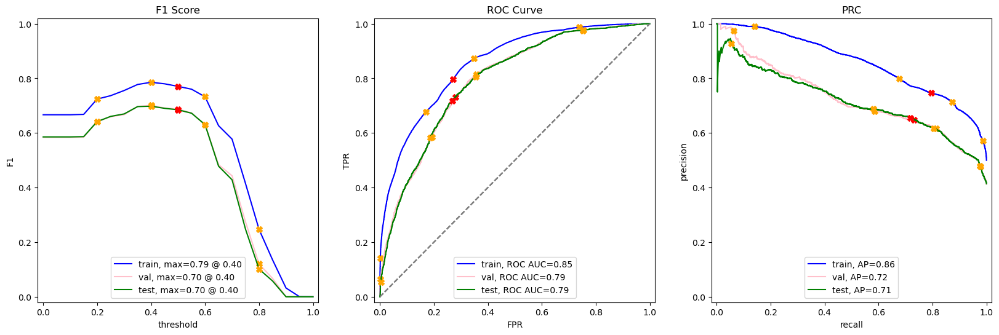

CPU times: user 15min 54s, sys: 23.1 s, total: 16min 17s
Wall time: 16min 28s


In [81]:
%%time

rf = RandomForestClassifier()

# Define a parameter grid to search
param_grid = {
    'n_estimators': [85, 100, 125],       
    'max_depth': [8, 9, 7, 6],      
    'min_samples_split': [3],      
    'min_samples_leaf': [7, 6, 5],        
    'max_features': ['auto', 'sqrt', 'log2'],
    'class_weight': ['balanced']
}

# Set up the GridSearchCV
grid_search = GridSearchCV(estimator=rf, 
                           param_grid=param_grid, 
                           scoring='roc_auc',  # or 'roc_auc' for binary classification
                           cv=5, 
                           verbose=0, 
                           n_jobs=None)

# Fit the model
grid_search.fit(train_ord.drop([target_field], axis=1), train_ord[target_field])

# Print the best parameters and best score
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

best_rf = RandomForestClassifier(**grid_search.best_params_)

# Fit the model on the training data
best_rf.fit(train_ord.drop([target_field], axis=1), train_ord[target_field])

# Predict on the test set
test_predictions = best_rf.predict(test_ord.drop([target_field], axis=1))

# Evaluate the model
structure_confusion_matrix(confusion_matrix(test_ord[target_field], test_predictions))
evaluate_model(model=best_rf, train_features=train_ord.drop(columns=target_field, axis=1), train_target=train_ord[target_field], 
                   test_features=test_ord.drop(columns=target_field, axis=1), test_target=test_ord[target_field], 
                   val_features=val_ord.drop(columns=target_field, axis=1), val_target=val_ord[target_field])
        
chart_feature_importance(features_train=train_ord.drop(columns=target_field, axis=1), model=best_rf)

### HalvingRandomSearchCV

{'n_estimators': 300, 'min_samples_split': 20, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': None, 'class_weight': 'balanced', 'bootstrap': True}
0.8387456215741119
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.732368,0.267632
Is True,0.285203,0.714797


,Predicted False,Predicted True
Is False,3188,1165
Is True,877,2198


             train       val      test
Accuracy  0.864638  0.723112  0.725094
F1        0.864364  0.684073  0.682821
APS       0.956528  0.722788  0.713550
ROC AUC   0.950639  0.794147  0.793537


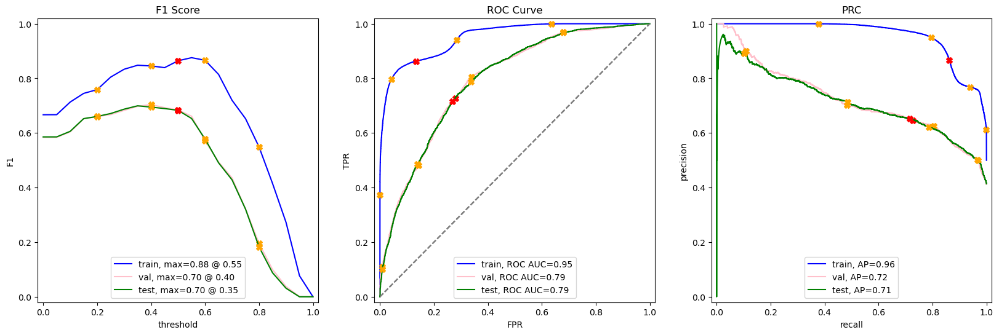

CPU times: user 58min 35s, sys: 37.9 s, total: 59min 13s
Wall time: 59min 55s


In [84]:
%%time

from sklearn.experimental import enable_halving_search_cv 
from sklearn.model_selection import HalvingRandomSearchCV
from scipy.stats import randint

rf = RandomForestClassifier(random_state=42)

param_distributions = {
    'n_estimators': [50, 100, 200, 300, 500],     # Number of trees in the forest
    'max_depth': [None, 5, 10, 15, 20],            # Maximum depth of the trees
    'min_samples_split': [2, 5, 10, 20],           # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4, 6, 8],           # Minimum number of samples required to be at a leaf node
    'max_features': ['auto', 'sqrt', 'log2'],      # Number of features to consider when looking for the best split
    'bootstrap': [True, False],                     # Whether to use bootstrap samples when building trees
    'class_weight': [None, 'balanced']              # Weights associated with classes
}
search = HalvingRandomSearchCV(rf, param_distributions,
    scoring='roc_auc',  # Optimize for ROC AUC score
    cv=5,
    factor=2,           # Reduce candidates by this factor
    resource='n_samples',  # Resource to be halved
    max_resources='auto',  # Automatically determine the maximum resources
    verbose=0,
    n_jobs=None).fit(train_ord.drop([target_field], axis=1), train_ord[target_field])
print(search.best_params_)
print(search.best_score_)
best_rf = RandomForestClassifier(**search.best_params_)

# Fit the model on the training data
best_rf.fit(train_ord.drop([target_field], axis=1), train_ord[target_field])

# Predict on the test set
test_predictions = best_rf.predict(test_ord.drop([target_field], axis=1))

# Evaluate the model
structure_confusion_matrix(confusion_matrix(test_ord[target_field], test_predictions))
evaluate_model(model=best_rf, train_features=train_ord.drop(columns=target_field, axis=1), train_target=train_ord[target_field], 
                   test_features=test_ord.drop(columns=target_field, axis=1), test_target=test_ord[target_field], 
                   val_features=val_ord.drop(columns=target_field, axis=1), val_target=val_ord[target_field])
        
chart_feature_importance(features_train=train_ord.drop(columns=target_field, axis=1), model=best_rf)

In [85]:
train_ord = train_search.copy()

### RandomForest

I make three models with the RandomForestClassifier varying the sampling methods and encodings. Reports are generated for each model.

Alzheimer’s Diagnosis
0.0    24575
1.0    24575
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.719504,0.280496
Is True,0.265366,0.734634


,Predicted False,Predicted True
Is False,3132,1221
Is True,816,2259


             train       val      test
Accuracy  0.737518  0.725400  0.725767
F1        0.741861  0.692308  0.689245
APS       0.813399  0.725580  0.710780
ROC AUC   0.818980  0.793685  0.791737


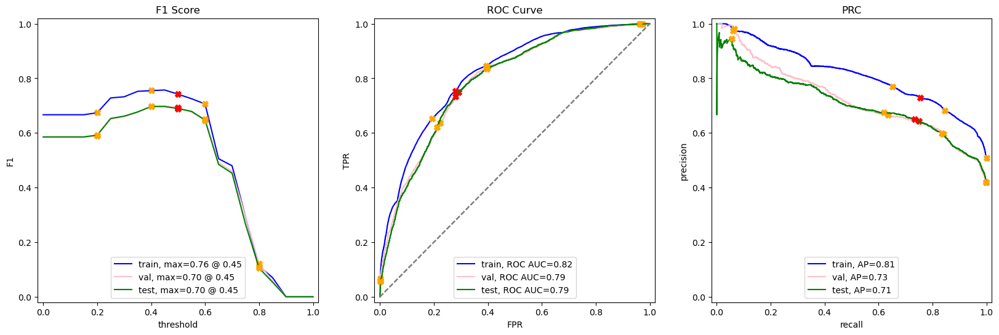

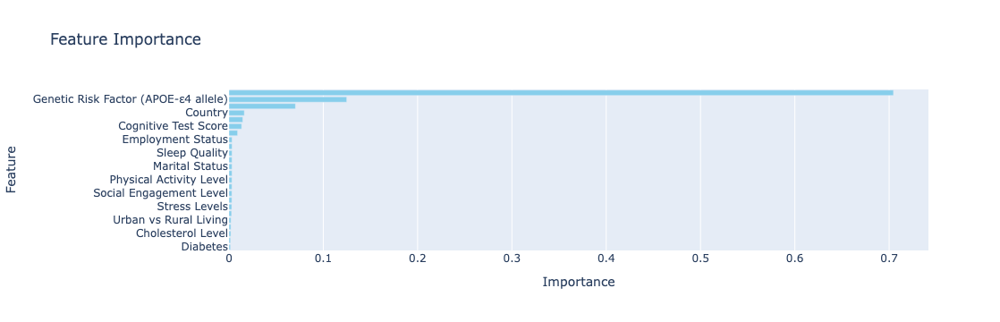

In [88]:
random_forest_model(train_ord, val_ord, test_ord, balanced='balanced', samp='down', target_field=target_field)

Alzheimer’s Diagnosis
0.0    34851
1.0    34851
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.720882,0.279118
Is True,0.265691,0.734309


,Predicted False,Predicted True
Is False,3138,1215
Is True,817,2258


             train       val      test
Accuracy  0.737626  0.720824  0.726440
F1        0.743168  0.687179  0.689676
APS       0.813981  0.726543  0.717397
ROC AUC   0.821381  0.795195  0.794154


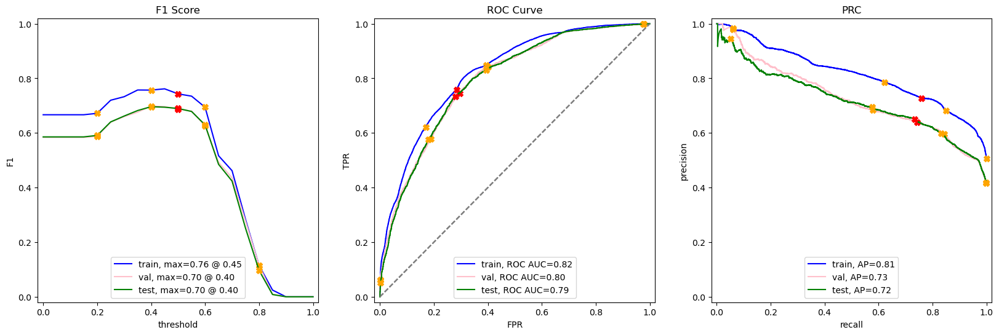

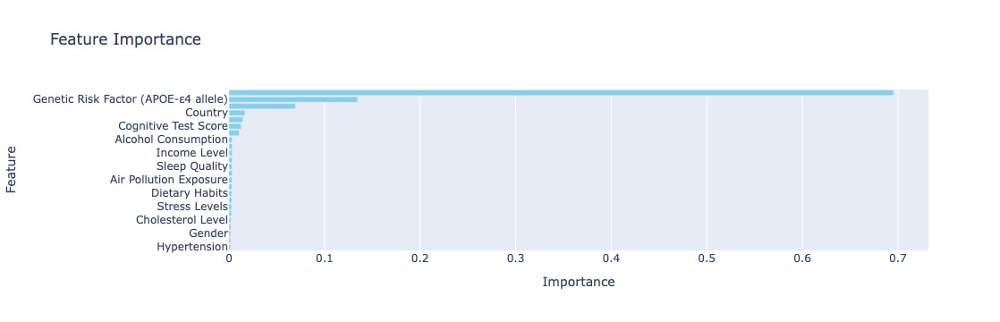

In [89]:
random_forest_model(train_ord, val_ord, test_ord, balanced='balanced', samp='up', target_field=target_field)

Alzheimer’s Diagnosis
0.0    34851
1.0    34851
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.723409,0.276591
Is True,0.270244,0.729756


,Predicted False,Predicted True
Is False,3149,1204
Is True,831,2244


             train       val      test
Accuracy  0.758744  0.723112  0.726037
F1        0.767831  0.688286  0.688027
APS       0.846930  0.726633  0.716034
ROC AUC   0.845408  0.795063  0.793048


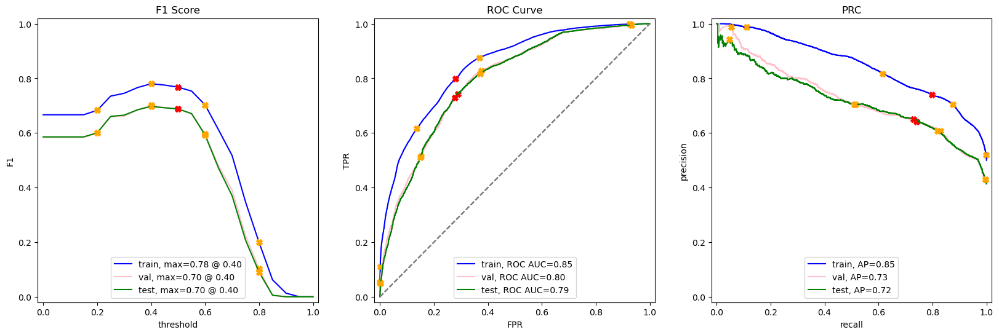

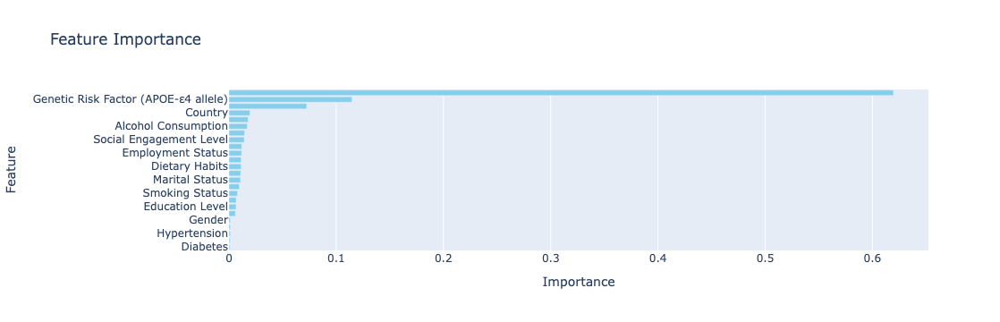

In [90]:
random_forest_model(train_ord, val_ord, test_ord, balanced='balanced', samp='smote', target_field=target_field)

### LightGBM

I make three models with the LightGBM classifier varying the sampling methods and encodings. Reports are generated for each model.

Alzheimer’s Diagnosis
0.0    24575
1.0    24575
Name: count, dtype: int64
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.759476,0.240524
Is True,0.327480,0.672520


,Predicted False,Predicted True
Is False,3306,1047
Is True,1007,2068


             train       val      test
Accuracy  0.742564  0.723920  0.723479
F1        0.734554  0.672312  0.668174
APS       0.819071  0.736320  0.721890
ROC AUC   0.828122  0.803327  0.800471


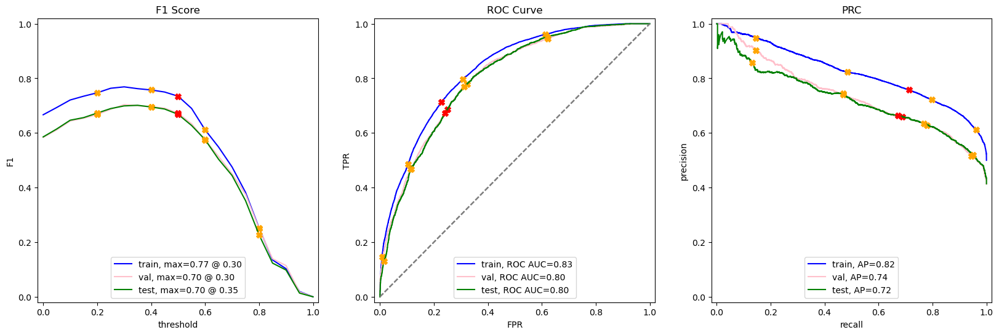

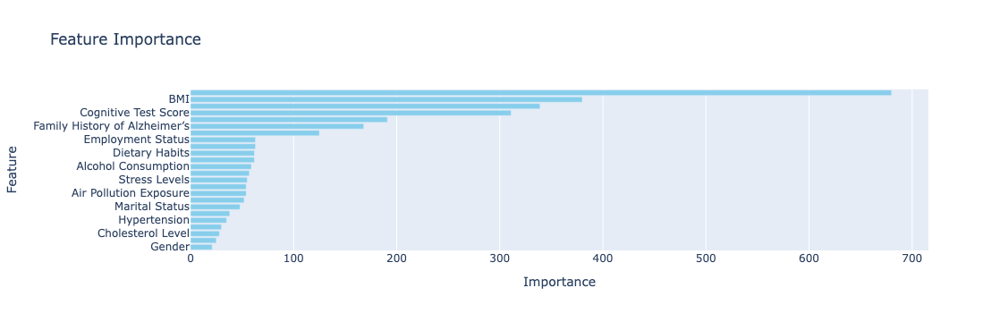

In [111]:
lgbmclassifier(train_ord, val_ord, test_ord, balanced='balanced', samp='down', target_field=target_field)

Alzheimer’s Diagnosis
0.0    34851
1.0    34851
Name: count, dtype: int64
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.759476,0.240524
Is True,0.327480,0.672520


,Predicted False,Predicted True
Is False,3306,1047
Is True,1007,2068


             train       val      test
Accuracy  0.743006  0.723920  0.723479
F1        0.735418  0.672312  0.668174
APS       0.819918  0.736320  0.721890
ROC AUC   0.828842  0.803327  0.800471


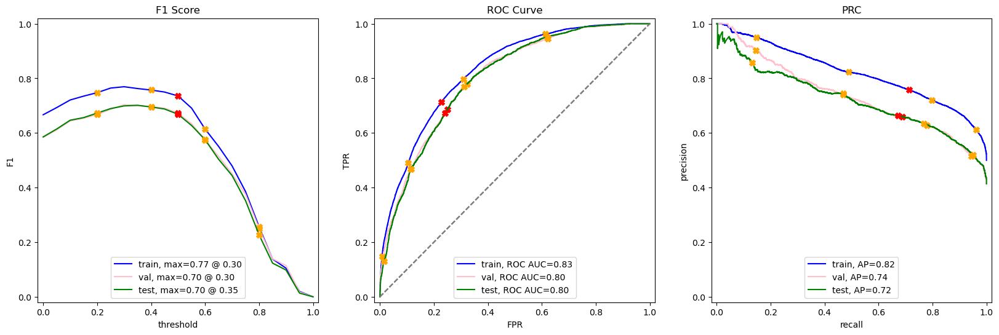

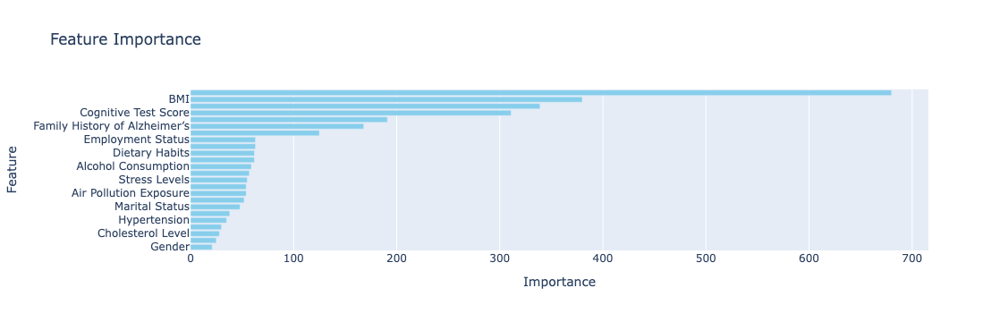

In [112]:
lgbmclassifier(train_ord, val_ord, test_ord, balanced='balanced', samp='up', target_field=target_field)

Alzheimer’s Diagnosis
0.0    34851
1.0    34851
Name: count, dtype: int64
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.759476,0.240524
Is True,0.327480,0.672520


,Predicted False,Predicted True
Is False,3306,1047
Is True,1007,2068


             train       val      test
Accuracy  0.743221  0.723920  0.723479
F1        0.735698  0.672312  0.668174
APS       0.819419  0.736320  0.721890
ROC AUC   0.828534  0.803327  0.800471


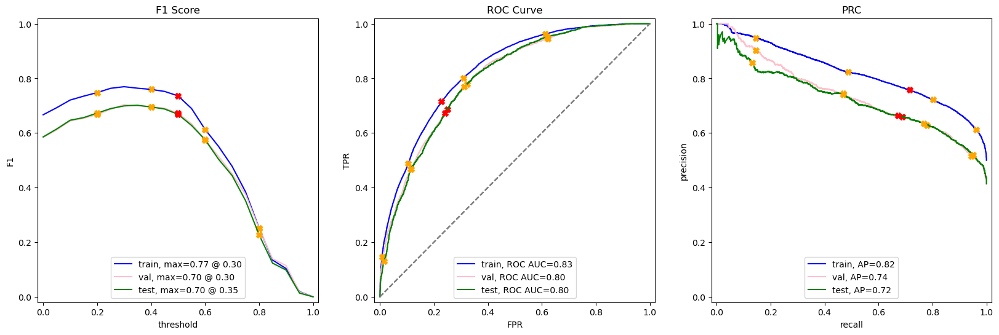

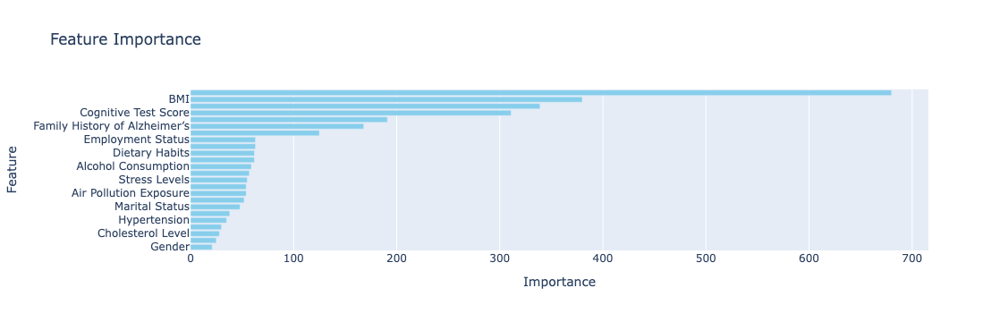

In [113]:
lgbmclassifier(train_ord, val_ord, test_ord, balanced='balanced', samp='smote', target_field=target_field)

### XGBoost

I make three models with the XGBoost classifier varying the sampling methods and encodings. Reports are generated for each model.

Alzheimer’s Diagnosis
0.0    24575
1.0    24575
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.762692,0.237308
Is True,0.356423,0.643577


,Predicted False,Predicted True
Is False,3320,1033
Is True,1096,1979


             train       val      test
Accuracy  0.784028  0.717189  0.713382
F1        0.773846  0.658096  0.650238
APS       0.872652  0.725006  0.706352
ROC AUC   0.874407  0.795937  0.788457


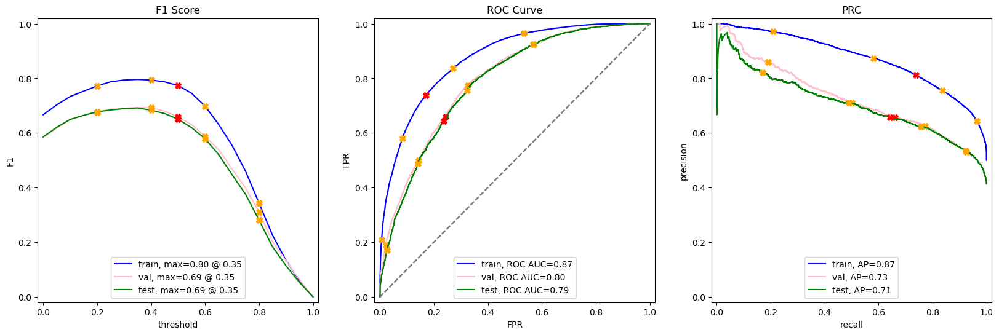

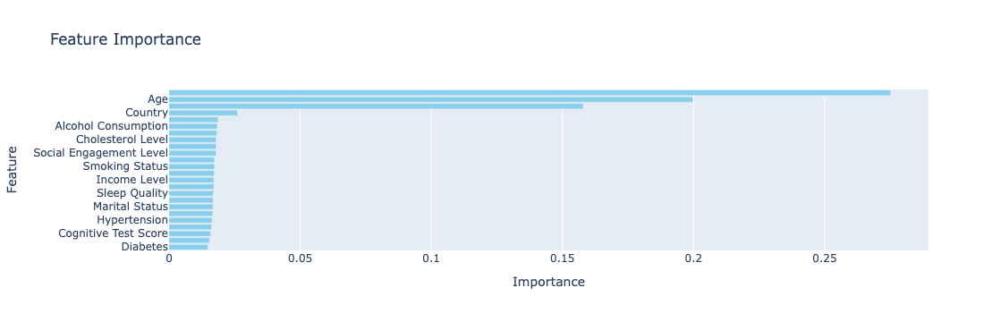

In [116]:
XGBmodel(train_ord, val_ord, test_ord, balanced='balanced', samp='down', target_field=target_field)

Alzheimer’s Diagnosis
0.0    34851
1.0    34851
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.762692,0.237308
Is True,0.356423,0.643577


,Predicted False,Predicted True
Is False,3320,1033
Is True,1096,1979


             train       val      test
Accuracy  0.782861  0.717189  0.713382
F1        0.772806  0.658096  0.650238
APS       0.872866  0.725006  0.706352
ROC AUC   0.874401  0.795937  0.788457


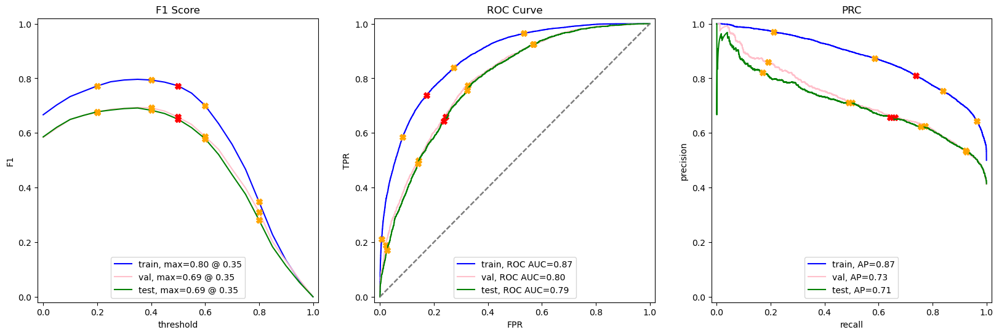

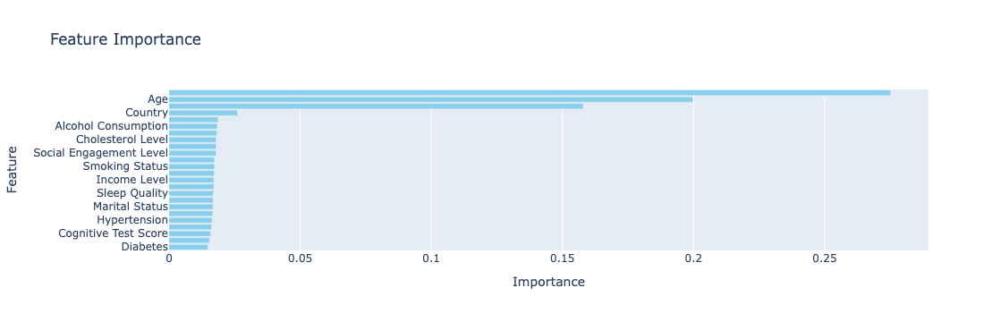

In [117]:
XGBmodel(train_ord, val_ord, test_ord, balanced='balanced', samp='up', target_field=target_field)

Alzheimer’s Diagnosis
0.0    34851
1.0    34851
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.762692,0.237308
Is True,0.356423,0.643577


,Predicted False,Predicted True
Is False,3320,1033
Is True,1096,1979


             train       val      test
Accuracy  0.773536  0.717189  0.713382
F1        0.760714  0.658096  0.650238
APS       0.862625  0.725006  0.706352
ROC AUC   0.864493  0.795937  0.788457


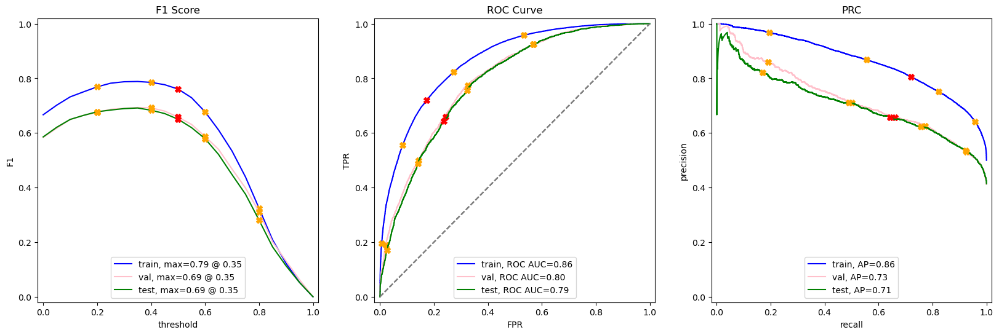

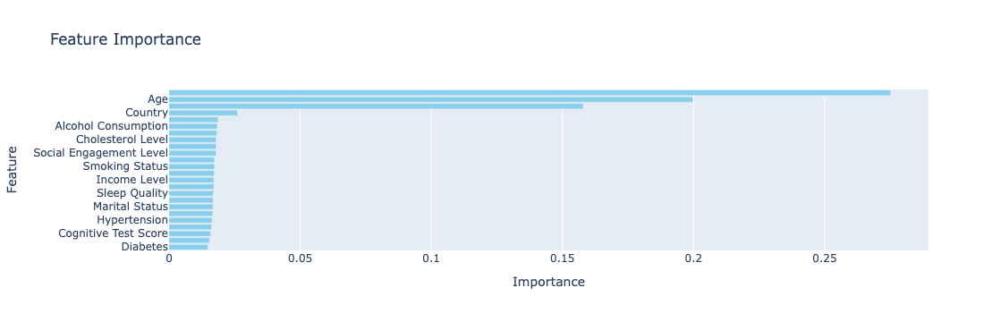

In [118]:
XGBmodel(train_ord, val_ord, test_ord, balanced='balanced', samp='smote', target_field=target_field)

### Stochastic Gradient Descent

I make only one model with the SGD classifier and upsampling the target.

Alzheimer’s Diagnosis
0.0    34851
1.0    34851
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.788422,0.211578
Is True,0.408780,0.591220


,Predicted False,Predicted True
Is False,3432,921
Is True,1257,1818


             train       val      test
Accuracy  0.694485  0.717862  0.706785
F1        0.663336  0.640233  0.625387
APS       0.765638  0.712413  0.698318
ROC AUC   0.784045  0.790435  0.782637


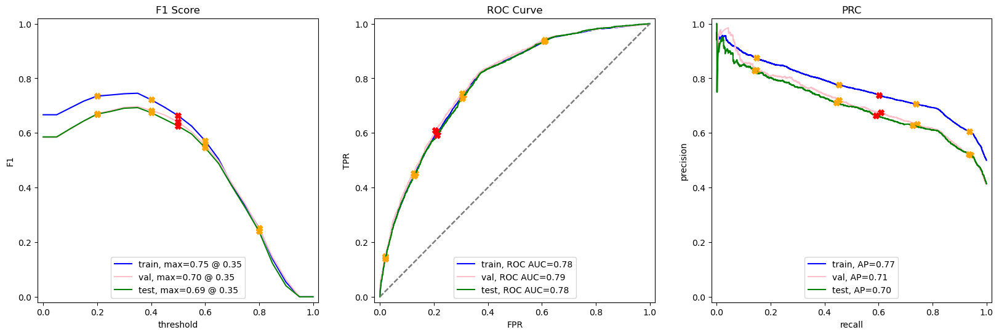

In [121]:
sgd_classifier(train_ord, val_ord, test_ord, balanced='balanced', samp='up', target_field=target_field)

### CatBoostClassifier

I make three models with the CatBoostClassifier varying the sampling methods and encodings. Reports are generated for each model.

Alzheimer’s Diagnosis
1.0    24575
0.0    24575
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.740639,0.259361
Is True,0.298537,0.701463


,Predicted False,Predicted True
Is False,3224,1129
Is True,918,2157


             train       val      test
Accuracy  0.731699  0.724862  0.724421
F1        0.729259  0.682016  0.678195
APS       0.799783  0.735935  0.724179
ROC AUC   0.810830  0.804524  0.800321


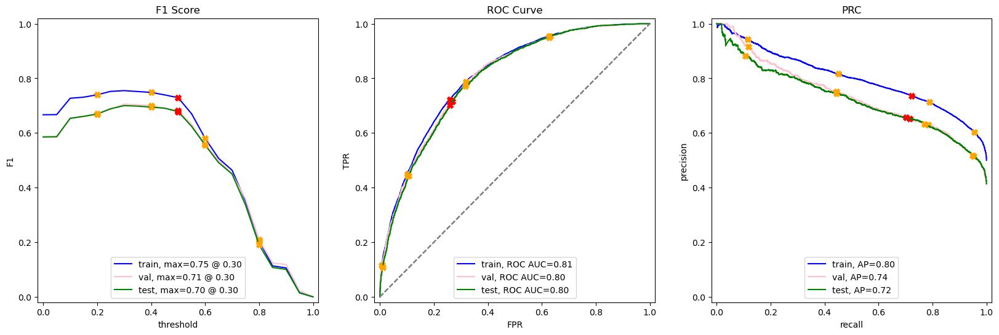

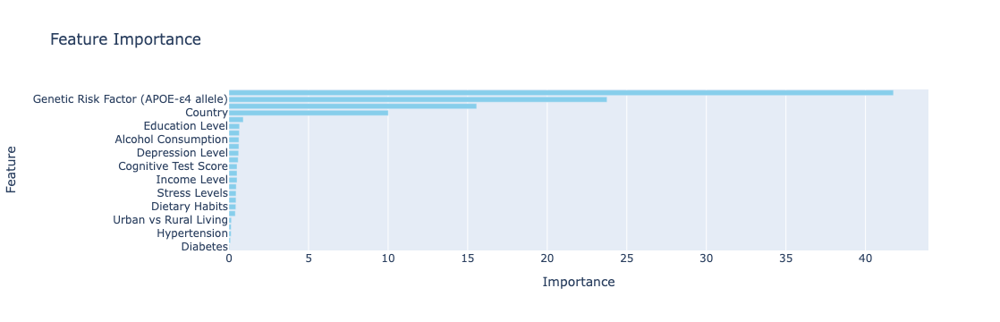

In [124]:
CatBoostClassifier_model(train_ord, val_ord, test_ord, balanced='balanced', samp='down', target_field=target_field)

Alzheimer’s Diagnosis
1.0    34851
0.0    34851
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.740639,0.259361
Is True,0.298537,0.701463


,Predicted False,Predicted True
Is False,3224,1129
Is True,918,2157


             train       val      test
Accuracy  0.730897  0.724862  0.724421
F1        0.728910  0.682016  0.678195
APS       0.800009  0.735935  0.724179
ROC AUC   0.810985  0.804524  0.800321


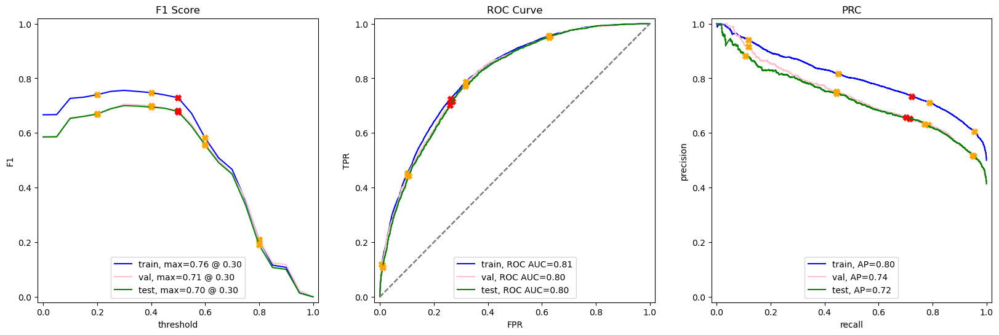

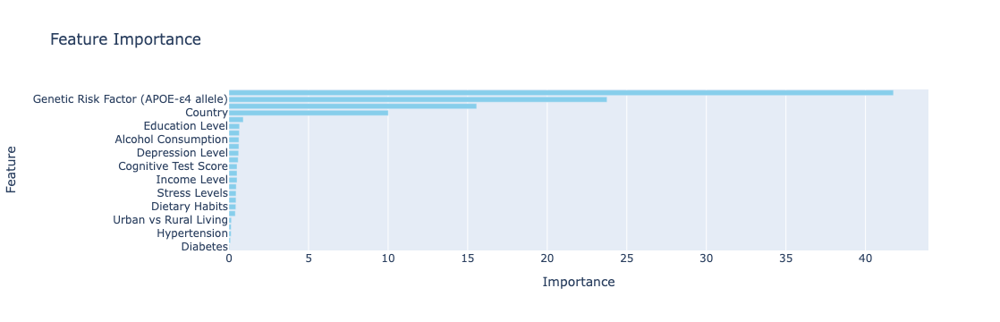

In [125]:
CatBoostClassifier_model(train_ord, val_ord, test_ord, balanced='balanced', samp='up', target_field=target_field)

Alzheimer’s Diagnosis
0.0    34851
1.0    34851
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.740639,0.259361
Is True,0.298537,0.701463


,Predicted False,Predicted True
Is False,3224,1129
Is True,918,2157


             train       val      test
Accuracy  0.733594  0.724862  0.724421
F1        0.732354  0.682016  0.678195
APS       0.800949  0.735935  0.724179
ROC AUC   0.813277  0.804524  0.800321


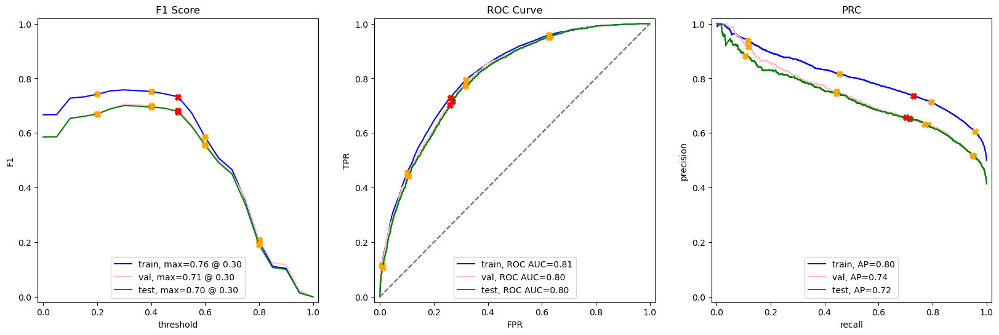

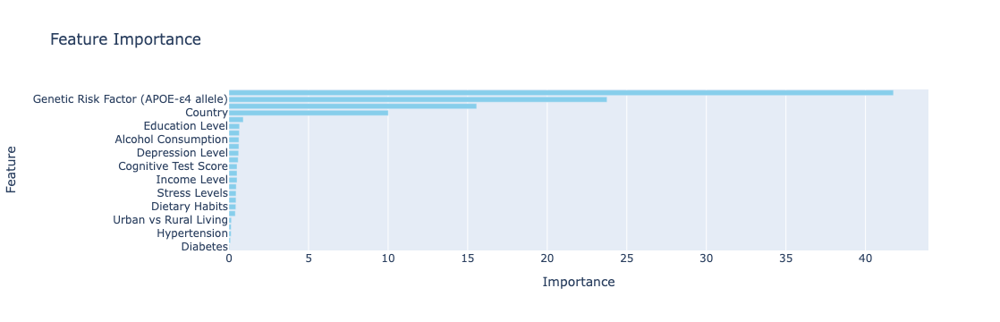

In [126]:
CatBoostClassifier_model(train_ord, val_ord, test_ord, balanced='balanced', samp='smote', target_field=target_field)

### Extra Trees

I make three models with the ExtraTreesClassifier varying the sampling methods and encodings. Reports are generated for each model.

Alzheimer’s Diagnosis
0.0    24575
1.0    24575
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.674937,0.325063
Is True,0.245528,0.754472


,Predicted False,Predicted True
Is False,2938,1415
Is True,755,2320


             train       val      test
Accuracy  0.729196  0.717055  0.707862
F1        0.741664  0.693139  0.681351
APS       0.792317  0.720386  0.705931
ROC AUC   0.801842  0.793078  0.785378


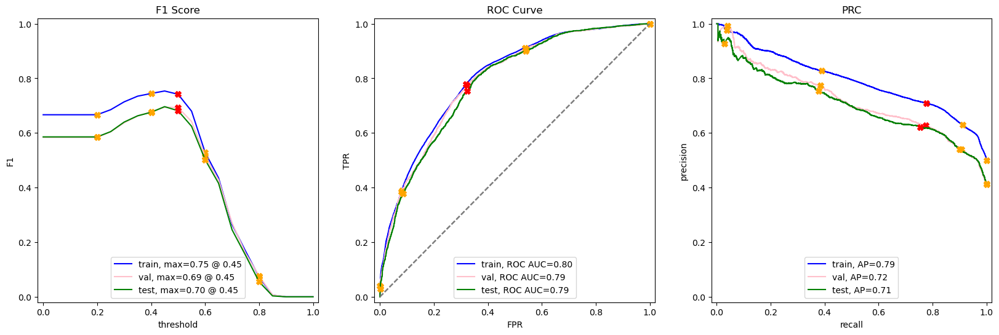

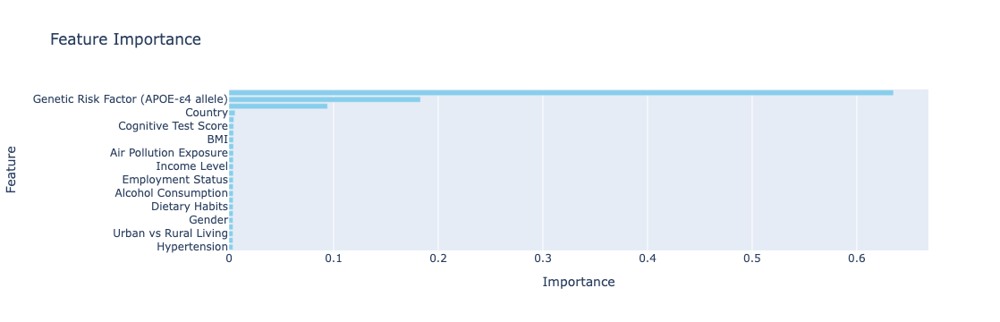

In [134]:
extra_trees_model(train_ord, val_ord, test_ord, balanced='balanced', samp='down', target_field=target_field)

Alzheimer’s Diagnosis
1.0    34851
0.0    34851
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.686193,0.313807
Is True,0.269593,0.730407


,Predicted False,Predicted True
Is False,2987,1366
Is True,829,2246


             train       val      test
Accuracy  0.724169  0.711670  0.704496
F1        0.733675  0.682102  0.671751
APS       0.792318  0.716766  0.703733
ROC AUC   0.801652  0.789996  0.783375


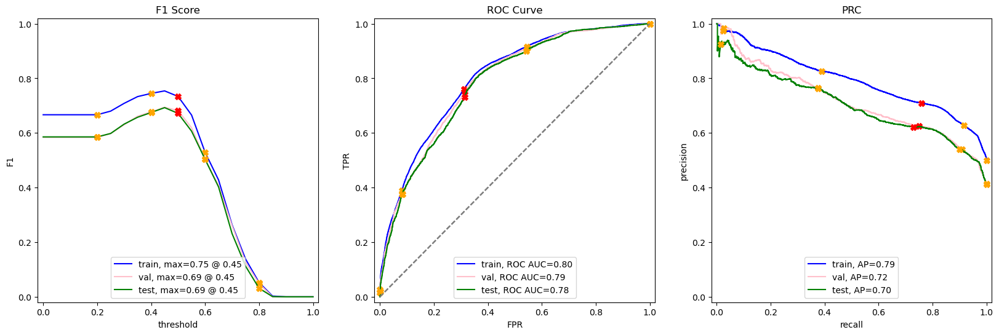

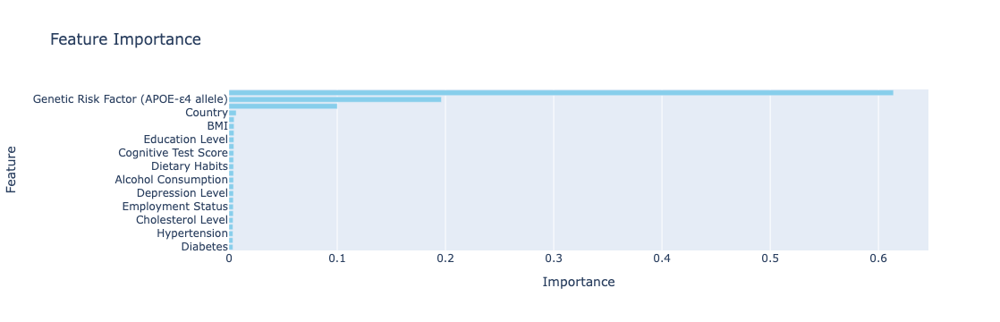

In [135]:
extra_trees_model(train_ord, val_ord, test_ord, balanced='balanced', samp='up', target_field=target_field)

Alzheimer’s Diagnosis
0.0    34851
1.0    34851
Name: count, dtype: int64
Confusion  matrixes  for  the  model  are  below,  first  by  percentage,  then  by  instances.


,Predicted False,Predicted True
Is False,0.691477,0.308523
Is True,0.266667,0.733333


,Predicted False,Predicted True
Is False,3010,1343
Is True,820,2255


             train       val      test
Accuracy  0.740696  0.714766  0.708805
F1        0.752513  0.684344  0.675858
APS       0.812533  0.719480  0.704904
ROC AUC   0.821298  0.792733  0.784993


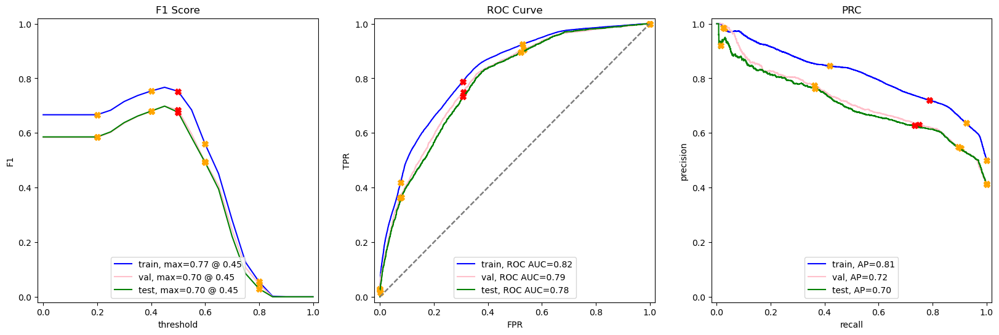

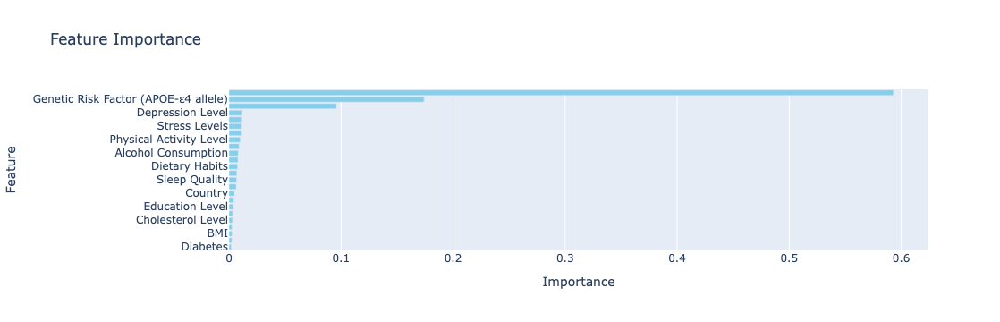

In [136]:
extra_trees_model(train_ord, val_ord, test_ord, balanced='balanced', samp='smote', target_field=target_field)

## Conclusions

In [138]:
eval_stats_all = eval_stats_all.drop_duplicates()
eval_stats_all.sort_values(by='test_roc_auc', ascending=False)

,model_name,full_model,test_accuracy,test_f1,test_roc_auc,test_aps
11,LGBMClassifier,"LGBMClassifier(boosting_type=gbdt, class_weigh...",0.723479,0.668174,0.800471,0.721890
18,CatBoostClassifier,"CatBoostClassifier(iterations=500, learning_ra...",0.724421,0.678195,0.800321,0.724179
4,LGBMClassifier,"LGBMClassifier(boosting_type=gbdt, class_weigh...",0.723479,0.670199,0.800302,0.723832
5,XGBClassifier,"XGBClassifier(objective=binary:logistic, base_...",0.721863,0.666559,0.800031,0.723632
9,RandomForestClassifier,"RandomForestClassifier(bootstrap=True, ccp_alp...",0.726440,0.689676,0.794154,0.717397
7,RandomForestClassifier,"RandomForestClassifier(bootstrap=True, ccp_alp...",0.725094,0.682821,0.793537,0.713550
6,RandomForestClassifier,"RandomForestClassifier(bootstrap=True, ccp_alp...",0.726171,0.684749,0.793420,0.714563
10,RandomForestClassifier,"RandomForestClassifier(bootstrap=True, ccp_alp...",0.726037,0.688027,0.793048,0.716034
8,RandomForestClassifier,"RandomForestClassifier(bootstrap=True, ccp_alp...",0.725767,0.689245,0.791737,0.710780
14,XGBClassifier,"XGBClassifier(objective=binary:logistic, base_...",0.713382,0.650238,0.788457,0.706352


Because of the way the dataframe is concatenated the index also represents the order in which these models were run and the order in which they appear in the 'Testing' section. The dataframe has been sorted to provide the models with the highest AUC-ROC score. I drop duplicates and resave the dataframe to ensure if any of the testing cells are run repeatedly, those results do not skew the above dataframe or any dependent code.

In [140]:
fig = px.bar(eval_stats_all.sort_values(by='test_roc_auc', ascending=False).reset_index(drop=True).head(5), hover_data={'model_name': True},
             y='test_roc_auc', title='Top Performing Models')
fig.show()

In [141]:
eval_stats_all.sort_values(by='test_roc_auc', ascending=False).reset_index(drop=True).head(8)

,model_name,full_model,test_accuracy,test_f1,test_roc_auc,test_aps
0,LGBMClassifier,"LGBMClassifier(boosting_type=gbdt, class_weigh...",0.723479,0.668174,0.800471,0.721890
1,CatBoostClassifier,"CatBoostClassifier(iterations=500, learning_ra...",0.724421,0.678195,0.800321,0.724179
2,LGBMClassifier,"LGBMClassifier(boosting_type=gbdt, class_weigh...",0.723479,0.670199,0.800302,0.723832
3,XGBClassifier,"XGBClassifier(objective=binary:logistic, base_...",0.721863,0.666559,0.800031,0.723632
4,RandomForestClassifier,"RandomForestClassifier(bootstrap=True, ccp_alp...",0.726440,0.689676,0.794154,0.717397
5,RandomForestClassifier,"RandomForestClassifier(bootstrap=True, ccp_alp...",0.725094,0.682821,0.793537,0.713550
6,RandomForestClassifier,"RandomForestClassifier(bootstrap=True, ccp_alp...",0.726171,0.684749,0.793420,0.714563
7,RandomForestClassifier,"RandomForestClassifier(bootstrap=True, ccp_alp...",0.726037,0.688027,0.793048,0.716034


The above view of the dataframe is provided to add more context to the bar graph above. The below cells show which model performed best in the other metrics that were not the primary metric.

In [144]:
eval_stats_all.sort_values(by='test_accuracy', ascending=False).head(1)

,model_name,full_model,test_accuracy,test_f1,test_roc_auc,test_aps
9,RandomForestClassifier,"RandomForestClassifier(bootstrap=True, ccp_alp...",0.72644,0.689676,0.794154,0.717397


In [145]:
pd.set_option('display.max_colwidth', None)
eval_stats_all.sort_values(by='test_accuracy', ascending=False).head(0)['full_model']

Series([], Name: full_model, dtype: object)

In [146]:
pd.reset_option('display.max_colwidth')

In [147]:
eval_stats_all.sort_values(by='test_f1', ascending=False).head(1)

,model_name,full_model,test_accuracy,test_f1,test_roc_auc,test_aps
9,RandomForestClassifier,"RandomForestClassifier(bootstrap=True, ccp_alp...",0.72644,0.689676,0.794154,0.717397


In [148]:
eval_stats_all.sort_values(by='test_aps', ascending=False).head(1)

,model_name,full_model,test_accuracy,test_f1,test_roc_auc,test_aps
18,CatBoostClassifier,"CatBoostClassifier(iterations=500, learning_ra...",0.724421,0.678195,0.800321,0.724179


In [195]:
eval_stats_all.reset_index(drop=True)

,model_name,full_model,test_accuracy,test_f1,test_roc_auc,test_aps
0,DummyClassifier,"DummyClassifier(constant=1, random_state=42, s...",0.413974,0.585547,0.500000,0.413974
1,LogisticRegression,"LogisticRegression(C=1.0, class_weight=balance...",0.707593,0.666462,0.782858,0.698086
2,LogisticRegression,"LogisticRegression(C=1.0, class_weight=balance...",0.709882,0.670136,0.782617,0.698090
3,LogisticRegression,"LogisticRegression(C=1.0, class_weight=balance...",0.708670,0.667996,0.782646,0.697759
4,LGBMClassifier,"LGBMClassifier(boosting_type=gbdt, class_weigh...",0.723479,0.670199,0.800302,0.723832
5,XGBClassifier,"XGBClassifier(objective=binary:logistic, base_...",0.721863,0.666559,0.800031,0.723632
6,RandomForestClassifier,"RandomForestClassifier(bootstrap=True, ccp_alp...",0.726171,0.684749,0.793420,0.714563
7,RandomForestClassifier,"RandomForestClassifier(bootstrap=True, ccp_alp...",0.725094,0.682821,0.793537,0.713550
8,RandomForestClassifier,"RandomForestClassifier(bootstrap=True, ccp_alp...",0.725767,0.689245,0.791737,0.710780
9,RandomForestClassifier,"RandomForestClassifier(bootstrap=True, ccp_alp...",0.726440,0.689676,0.794154,0.717397


In [150]:
final_time = time.time() - initial_time
print('Notebook time: ', final_time)

Notebook time:  8457.101999998093


In [153]:
print(final_time / 60, 'minutes to run this notebook.')

140.9516999999682 minutes to run this notebook.


The vast majority of these models have similar performance metrics. With the exception of the the dummy model, all recorded metrics exist within three-hundreths of each other. The RandomForestClassifier model at index 9 in the table above has the best accuracy and f1 score. The CatBoostClassifier at index 14 has the highest aps on the test set. The LGBMClassifier at index 11 has the best AUC-ROC score. 

Deep learning algorithms like convultional neural networks (CNN) will be explored to see if those models are a better fit for this type of data in a subsequent notebook.